Implementation of various models on VHI data for Rajasthan dataset

# Rajasthan dataset

In [ ]:
import numpy as np
#from google.colab.patches import cv2_imshow
from PIL import Image
import cv2
import scipy.misc
import matplotlib
#import xgboost as XGBClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, ConvLSTM2D, Flatten, Dropout, MaxPooling2D,MaxPooling3D, TimeDistributed, Conv2D, LSTM, SimpleRNN, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import MinMaxScaler

In [ ]:
import io
import matplotlib.pyplot as plt
import imageio
from sklearn.metrics import r2_score
# from IPython.display import Image, display
# from ipywidgets import widgets, Layout, HBox
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import UpSampling3D
from tensorflow.keras.layers import MaxPooling3D

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

## Data Loading

In [ ]:
#data preprocessing

# load and prepare training images
def load_real_samples(filename):
	# load compressed arrays
	data = np.load(filename)
	# unpack arrays
	X1, X2 = data['x'], data['y']
	# scale from [0,255] to [-1,1]
	# X1 = (X1 - 127.5) / 127.5
	# X2 = (X2 - 127.5) / 127.5
	return [X1, X2]



In [ ]:
#@title
dataset = load_real_samples(r"E:\Jyoti Shukla - MS\rajasthan dataset\paired_arrays_train_rajasthan_AVHRR_data.npz")
dataset_test = load_real_samples(r'E:\Jyoti Shukla - MS\rajasthan dataset\paired_arrays_test_rajasthan_AVHRR_data.npz')
train_dataset, train_labels = dataset[0],dataset[1]
test_dataset, test_labels = dataset_test[0], dataset_test[1]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(train_dataset.shape) + ", " + str(train_labels.shape))
print("Validation Dataset Shapes: " + str(test_dataset.shape) + ", " + str(test_labels.shape))
np.max(train_dataset), np.min(train_dataset), np.max(test_dataset), np.min(test_dataset)

Training Dataset Shapes: (1999, 192, 256, 1), (1999, 192, 256, 1)
Validation Dataset Shapes: (65, 192, 256, 1), (65, 192, 256, 1)


(1.0, 0.0, 1.0, 0.0)

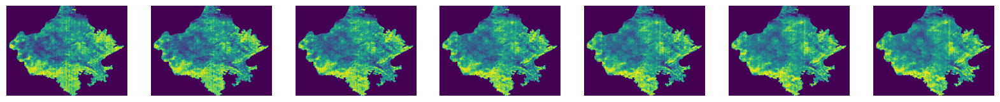

In [ ]:
from matplotlib import pyplot
idx = np.random.randint(0, len(dataset[0]),7)
plt.figure(figsize=(20,20))
for i in range(len(idx)):
    #define subplot
    pyplot.subplot(1,7,1+i)
    #turn off acis
    pyplot.axis('off')
    #plot raw pixel data
    pyplot.imshow(dataset[0][i].reshape(192,256))
    #show title
    #pyplot.title(titles[i])
pyplot.show()

## Sampling temporally to feed to LSTM

In [ ]:
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [ ]:
dataset = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\paired_padded_arrays_train_AVHRR_data.npz")
dataset_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\paired_padded_arrays_test_AVHRR_data.npz")
train_dataset, train_labels = dataset[0],dataset[1]
test_dataset, test_labels = dataset_test[0], dataset_test[1]
# Inspect the dataset.
print("Training Dataset Shapes: " + str(train_dataset.shape) + ", " + str(train_labels.shape))
print("Validation Dataset Shapes: " + str(test_dataset.shape) + ", " + str(test_labels.shape))

Training Dataset Shapes: (1899, 192, 128, 1), (1899, 192, 128, 1)
Validation Dataset Shapes: (60, 192, 128, 1), (60, 192, 128, 1)


In [ ]:
x_train, y_train, n_steps = split_sequence(train_dataset, 2)
x_test, y_test, n_steps = split_sequence(test_dataset,2)
print("Training Dataset Shapes: " + str(x_train.shape) + ", " + str(y_train.shape))
print("Validation Dataset Shapes: " + str(x_test.shape) + ", " + str(y_test.shape))

Training Dataset Shapes: (1997, 2, 192, 256, 1), (1997, 192, 256, 1)
Validation Dataset Shapes: (63, 2, 192, 256, 1), (63, 192, 256, 1)


## ConvLSTM with Conv3D

In [ ]:
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[i+1:end_ix+1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), n_steps

In [ ]:
x_train, y_train, n_steps = split_sequence(train_dataset, 2)
x_test, y_test, n_steps = split_sequence(test_dataset,2)
print("Training Dataset Shapes: " + str(x_train.shape) + ", " + str(y_train.shape))
print("Validation Dataset Shapes: " + str(x_test.shape) + ", " + str(y_test.shape))

Training Dataset Shapes: (1997, 2, 192, 256, 1), (1997, 2, 192, 256, 1)
Validation Dataset Shapes: (63, 2, 192, 256, 1), (63, 2, 192, 256, 1)


## Convlstm and conv3d

In [ ]:
inp = layers.Input(shape=(None, *x_train.shape[2:]))
inp.shape

TensorShape([None, None, 192, 256, 1])

In [ ]:
# Construct the input layer with no definite frame size.
inp = layers.Input(shape=(None, *x_train.shape[2:]))

# We will construct 3 `ConvLSTM2D` layers with batch normalization,
# followed by a `Conv3D` layer for the spatiotemporal outputs.
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(inp)
x = layers.BatchNormalization()(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.BatchNormalization()(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
#x = layers.Dropout(0.3)(x)

x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.BatchNormalization()(x)
#x = layers.Dropout(0.3)(x)
#x = layers.UpSampling3D((2, 2,2))(x)

x = layers.ConvLSTM2D(
    filters=128,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.BatchNormalization()(x)

x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.BatchNormalization()(x)
#x = layers.UpSampling3D((2, 2,2))(x)
# x = layers.Dropout(0.3)(x)
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.Conv3D(
    filters=1, kernel_size=(3, 3, 3), activation="sigmoid", padding="same"
)(x)

# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, x)
model.compile(
    loss='mse', optimizer=keras.optimizers.SGD(learning_rate=0.1),metrics=[tf.keras.metrics.mse]
)
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, 256, 256,   0         
                             1)]                                 
                                                                 
 conv_lstm2d_16 (ConvLSTM2D)  (None, None, 256, 256, 1  9856     
                             6)                                  
                                                                 
 batch_normalization_13 (Bat  (None, None, 256, 256, 1  64       
 chNormalization)            6)                                  
                                                                 
 conv_lstm2d_17 (ConvLSTM2D)  (None, None, 256, 256, 3  55424    
                             2)                                  
                                                                 
 batch_normalization_14 (Bat  (None, None, 256, 256, 3  128

In [ ]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 30
batch_size = 2

# Fit the model to the training data.
model.fit(
    x_train,
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    callbacks=[early_stopping, reduce_lr],
)

Epoch 1/30
43/43 [==============================] - 215s 5s/step - loss: 0.0646 - cosine_similarity: 0.8949 - val_loss: 0.0557 - val_cosine_similarity: 0.9113 - lr: 0.1000
Epoch 2/30
43/43 [==============================] - 200s 5s/step - loss: 0.0598 - cosine_similarity: 0.9002 - val_loss: 0.0558 - val_cosine_similarity: 0.9112 - lr: 0.1000
Epoch 3/30
43/43 [==============================] - 200s 5s/step - loss: 0.0534 - cosine_similarity: 0.9122 - val_loss: 0.0561 - val_cosine_similarity: 0.9112 - lr: 0.1000
Epoch 4/30
43/43 [==============================] - 200s 5s/step - loss: 0.0442 - cosine_similarity: 0.9279 - val_loss: 0.0565 - val_cosine_similarity: 0.9111 - lr: 0.1000
Epoch 5/30
43/43 [==============================] - 200s 5s/step - loss: 0.0358 - cosine_similarity: 0.9402 - val_loss: 0.0564 - val_cosine_similarity: 0.9112 - lr: 0.1000
Epoch 6/30
43/43 [==============================] - 200s 5s/step - loss: 0.0315 - cosine_similarity: 0.9481 - val_loss: 0.0551 - val_cosine_

In [ ]:
model.save("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/convlstm_conv3d_morelayers_30epochs.h5")

In [ ]:
model.save("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/convlstm_conv3d_70epochs.h5")

In [ ]:
from keras.models import load_model
model_1 = load_model("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/convlstm_conv3d_70epochs.h5")
model_2= load_model("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/convlstm_conv3d_morelayers_30epochs.h5")

In [ ]:
model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None, 256, 256,   0         
                             1)]                                 
                                                                 
 conv_lstm2d_5 (ConvLSTM2D)  (None, None, 256, 256, 1  9856      
                             6)                                  
                                                                 
 batch_normalization_4 (Batc  (None, None, 256, 256, 1  64       
 hNormalization)             6)                                  
                                                                 
 conv_lstm2d_6 (ConvLSTM2D)  (None, None, 256, 256, 3  55424     
                             2)                                  
                                                                 
 batch_normalization_5 (Batc  (None, None, 256, 256, 3  128

In [ ]:
framed = x_test[3][:1,...]
pred = model.predict(np.expand_dims(framed, axis=0))
y_real = y_test[3][0]
pred = pred.reshape(256,256,1)
plt.imshow(pred.reshape(256,256))
plt.figure()
plt.imshow(y_real.reshape(256,256))

ValueError: ignored

In [ ]:
np.max(pred),np.max(y_real)

(0.5000752, 1.0000000000000004)

In [ ]:
#extracting predicted frame from every series of 4 images
test_predicted = model_1.predict(x_test)
#predicted.shape[0]
p =[]
for i in range(test_predicted.shape[0]):
  arr = test_predicted[i][0]
  p.append(arr)
test_set = np.asarray(p)
test_set.shape

(17, 256, 256, 1)

In [ ]:
train_predicted = model.predict(x_train)
p=[]
for i in range(train_predicted.shape[0]):
  arr = train_predicted[i][0]
  p.append(arr)
train_set = np.asarray(p)
train_set.shape

(86, 256, 256, 1)

In [ ]:
#save the temporal values in txt file
# saving the temporal features values
train_file = open("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/train_lstm3D.txt","w")
for i in range(train_set.shape[0]):
  array = train_set[i].reshape(256,256)
  np.savetxt(train_file,array)
train_file.close()

test_file = open("/content/drive/MyDrive/DATA_GAN/Models_by_convlstm_con3d/test_lstm3D.txt","w")
for i in range(test_set.shape[0]):
  array = test_set[i].reshape(256,256)
  np.savetxt(test_file,array)
test_file.close()


In [ ]:
example = x_test[np.random.choice(range(len(x_test)), size=1)[0]]
frames = example[:2, ...]
original_frames = example[2:, ...]

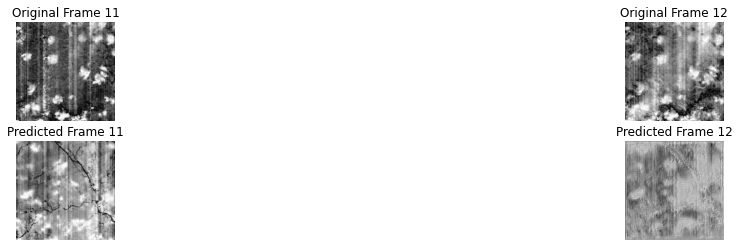

In [ ]:
# Predict a new set of 10 frames.
for _ in range(2):
    # Extract the model's prediction and post-process it.
    new_prediction = model.predict(np.expand_dims(frames, axis=0))
    new_prediction = np.squeeze(new_prediction, axis=0)
    predicted_frame = np.expand_dims(new_prediction[-1, ...], axis=0)

    # Extend the set of prediction frames.
    frames = np.concatenate((frames, predicted_frame), axis=0)

# Construct a figure for the original and new frames.
fig, axes = plt.subplots(2, 2, figsize=(20, 4))

# Plot the original frames.
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(original_frames[idx]), cmap="gray")
    ax.set_title(f"Original Frame {idx + 11}")
    ax.axis("off")

# Plot the new frames.
new_frames = frames[1:, ...]
for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(new_frames[idx]), cmap="gray")
    ax.set_title(f"Predicted Frame {idx + 11}")
    ax.axis("off")

# Display the figure.
plt.show()

In [ ]:
original_frames[1]

In [ ]:
frames[0]

In [ ]:
frames[1]

In [ ]:
frames[2]

In [ ]:
frames[3]

## ABOVE MODEL WITH HUBER LOSS

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa

In [ ]:
inp = layers.Input(shape=(None, *x_train.shape[2:]))
inp.shape

TensorShape([None, None, 192, 256, 1])

In [ ]:
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(inp)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =8)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =16)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.Dropout(0.3)(x)

# x = layers.ConvLSTM2D(
#     filters=64,
#     kernel_size=(3, 3),
#     padding="same",
#     return_sequences=True,
#     activation="relu",
# )(x)
# #x = layers.BatchNormalization()(x)
# x = tfa.layers.GroupNormalization(groups =16)(x)
#x = layers.Dropout(0.3)(x)
#x = layers.UpSampling3D((2, 2,2))(x)

x = layers.ConvLSTM2D(
    filters=128,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = tfa.layers.GroupNormalization(groups =64)(x)
#x = layers.BatchNormalization()(x)

# x = layers.ConvLSTM2D(
#     filters=256,
#     kernel_size=(3, 3),
#     padding="same",
#     return_sequences=True,
#     activation="relu",
# )(x)
# x = tfa.layers.GroupNormalization(groups =64)(x)

x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)

x = tfa.layers.GroupNormalization(groups =32)(x)
#x = layers.UpSampling3D((2, 2, 2))(x)
# x = layers.Dropout(0.3)(x)
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
#x = layers.BatchNormalization()(x)
x = tfa.layers.GroupNormalization(groups =8)(x)
x = layers.Conv3D(
    filters=1, kernel_size=(3, 3, 3), activation="sigmoid", padding="same"
)(x)
huber_loss = tf.keras.losses.Huber(delta=0.15)
# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, x)
model.compile(
    loss= huber_loss, optimizer=keras.optimizers.SGD(learning_rate=0.25),metrics=[tf.keras.metrics.mse]
)
model.summary()



Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, None, 192, 256, 1 0         
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, None, 192, 256, 16 9856      
_________________________________________________________________
group_normalization (GroupNo (None, None, 192, 256, 16 32        
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, None, 192, 256, 64 184576    
_________________________________________________________________
group_normalization_1 (Group (None, None, 192, 256, 64 128       
_________________________________________________________________
dropout (Dropout)            (None, None, 192, 256, 64 0         
_________________________________________________________________
conv_lst_m2d_3 (ConvLSTM2D)  (None, None, 192, 256, 12 885248

In [ ]:
train = x_train
train_y = y_train
test = x_test
test_y = y_test

In [ ]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 40
batch_size = 2

# Fit the model to the training data.
history = model.fit(
    train,
    train_y,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(test, test_y),
    callbacks=[early_stopping, reduce_lr],
)

model.save("E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv3d_AVHRR_model_rajasthan_6.1.h5")

# Results of updated model
np.save("E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv3d_AVHRR_model_rajasthan_6.1_history.npy",history.history)

Epoch 1/40
999/999 [==============================] - 488s 468ms/step - loss: 0.0027 - mean_squared_error: 0.0063 - val_loss: 0.0022 - val_mean_squared_error: 0.0046
Epoch 2/40
999/999 [==============================] - 469s 469ms/step - loss: 0.0015 - mean_squared_error: 0.0033 - val_loss: 0.0015 - val_mean_squared_error: 0.0031
Epoch 3/40
999/999 [==============================] - 469s 470ms/step - loss: 0.0012 - mean_squared_error: 0.0026 - val_loss: 0.0012 - val_mean_squared_error: 0.0026
Epoch 4/40
999/999 [==============================] - 469s 469ms/step - loss: 0.0011 - mean_squared_error: 0.0023 - val_loss: 0.0011 - val_mean_squared_error: 0.0023
Epoch 5/40
999/999 [==============================] - 469s 469ms/step - loss: 9.9630e-04 - mean_squared_error: 0.0021 - val_loss: 0.0013 - val_mean_squared_error: 0.0028
Epoch 6/40
999/999 [==============================] - 466s 466ms/step - loss: 9.2264e-04 - mean_squared_error: 0.0019 - val_loss: 0.0012 - val_mean_squared_error: 0.0

KeyboardInterrupt: 

load convlstm+conv3d model

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model= load_model(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\convlstm_conv3d_AVHRR_rajasthan_model_6.1.h5")
history=np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\convlstm_conv3d_AVHRR_rajasthan_model_6.1_history.npy",allow_pickle='TRUE').item()

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, 192, 256, 1 0         
_________________________________________________________________
conv_lst_m2d (ConvLSTM2D)    (None, None, 192, 256, 16 9856      
_________________________________________________________________
group_normalization (GroupNo (None, None, 192, 256, 16 32        
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, None, 192, 256, 64 184576    
_________________________________________________________________
group_normalization_1 (Group (None, None, 192, 256, 64 128       
_________________________________________________________________
dropout (Dropout)            (None, None, 192, 256, 64 0         
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, None, 192, 256, 12 885248

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

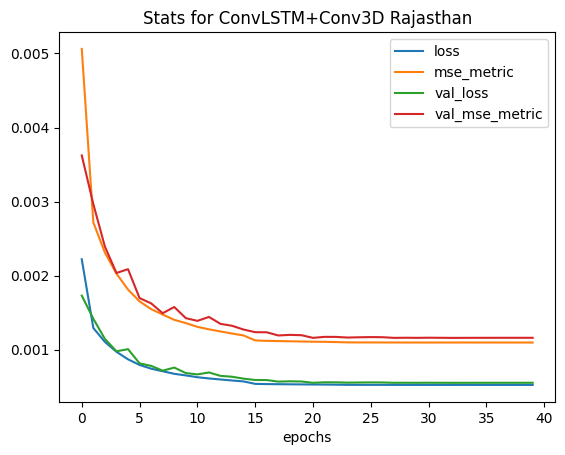

In [ ]:
# Results of updated model

plt.plot(history['loss'])
plt.plot(history['mean_squared_error'])
plt.plot(history['val_loss'])
plt.plot(history['val_mean_squared_error'])

plt.title('Stats for ConvLSTM+Conv3D Rajasthan')
plt.xlabel('epochs')
plt.legend(['loss','mse_metric','val_loss','val_mse_metric'])
plt.show()

In [ ]:
tf.function(experimental_relax_shapes=True)

<function tensorflow.python.eager.def_function.function.<locals>.decorated(inner_function)>

mse 0.013855481
r2 score is: 0.7506737959977254 

discrete values, predicted and real respectively: 0.0053001195 0.0


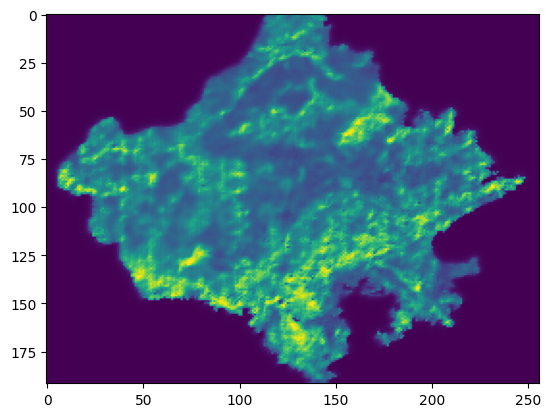

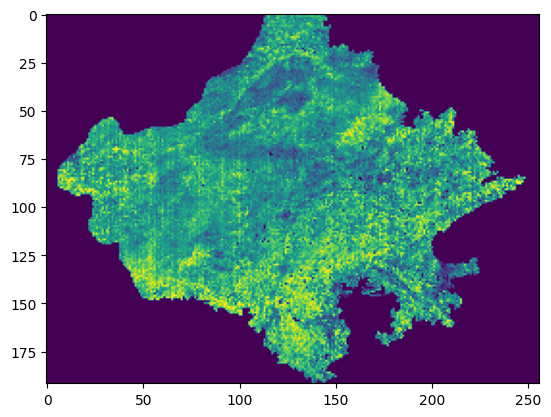

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error as mse
framed = x_test[3][:1,...]
pred = model.predict(np.expand_dims(framed, axis=0))
y_real = y_test[3][0]
pred = pred.reshape(192,256,1)
plt.imshow(pred.reshape(192,256))
plt.figure()
plt.imshow(y_real.reshape(192,256))
r2 = r2_score(y_real.reshape(192,256),pred.reshape(192,256))
mse = mse(y_real.reshape(192,256),pred.reshape(192,256))
print("mse",mse)
print("r2 score is:", r2,"\n")
pred = pred.reshape(192,256)
y_real = y_real.reshape(192,256)
print("discrete values, predicted and real respectively:",(pred.reshape(192,256))[50][30],(y_real.reshape(192,256))[50][30])

In [ ]:
pred = pred.reshape(192,256)
y_real = y_real.reshape(192,256)
print((pred.reshape(192,256))[50][30],(y_real.reshape(192,256))[50][30])

0.0053001195 0.0


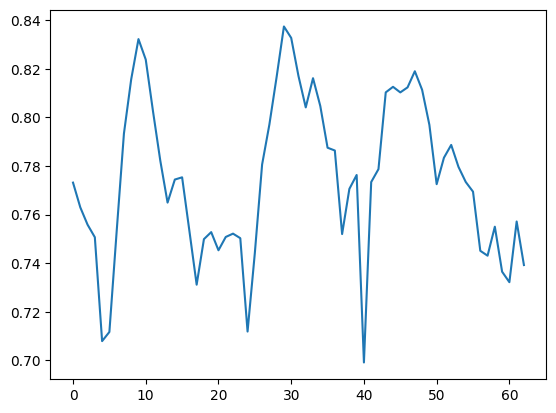

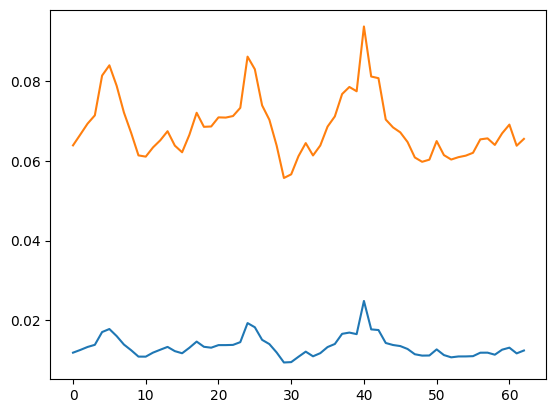

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = x_test
label = y_test
predicted =[]
true = []
R2 =[]
res = []
MSE =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i][0].reshape(192,256)
    test = framed.reshape(1,1,192,256,1)
    pred = model.predict(test)
    pred = pred.reshape(192,256)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    err = mse(y_real,pred)
    MSE.append(err)
    res.append(residual)
    predicted.append(pred)
    true.append(y_real)
    R2.append(r2)
plt.plot(R2)
plt.show()
plt.plot(MSE)
plt.plot(res)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\R2_score_convlstm_conv3d_AVHRR_rajasthan_model_6.1.npy", R2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\MSE_for_convlstm_conv3d_AVHRR_rajasthan_model_6.1.npy", MSE)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\MAE_for_convlstm_conv3d_AVHRR_rajasthan_model_6.1.npy", res)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\predicted_convlstm_conv3d_AVHRR_rajasthan_model_6.1.npy", predicted)

In [ ]:
np.mean(R2), np.max(R2), np.mean(res), np.mean(MSE)

(0.7745962168861515, 0.8373996595300673, 0.06848825, 0.013409223)

## LR Trial

In [ ]:
# pred = pred.flatten()
# y_real= y_real.flatten()
from sklearn.linear_model import LinearRegression
mod = LinearRegression().fit(pred,y_real)
r_sq = mod.score(pred,y_real)
coef = mod.coef_
intercept = mod.intercept_
print(coef.shape)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {mod.intercept_}")
print(f"slope: {mod.coef_}")

(124, 124)
coefficient of determination: 0.9864454655997172
intercept: [-0.03918012 -0.05821887 -0.01968738 -0.03113922 -0.04394657 -0.03886133
  0.02974238 -0.02001564 -0.05447686  0.01001643  0.07383002 -0.03844599
  0.03089428  0.13322137  0.07611212  0.03606588  0.00854969  0.01859784
  0.07428735  0.02239516  0.04331639  0.04521036  0.00475538 -0.02670798
 -0.06129897 -0.07926312 -0.06343377 -0.05272245 -0.04072645 -0.04168999
 -0.10615626 -0.0510827   0.00450006 -0.01799846  0.02627289  0.0633949
  0.05338553  0.09494111 -0.00571108 -0.01648021 -0.11916798 -0.13389629
 -0.09158874 -0.03772599 -0.00871044 -0.04668289  0.03520465 -0.03614342
 -0.08865058 -0.14718121 -0.02666748  0.01203138 -0.05985934 -0.00685692
 -0.06856227  0.0145179  -0.00479013 -0.05616802 -0.0048489   0.02796584
  0.00985801  0.03221816  0.04145044  0.04809272 -0.02850169  0.00969988
 -0.1293034  -0.12764251 -0.06628299 -0.07218599 -0.16153115 -0.10444611
 -0.09171373 -0.0853548  -0.21520942 -0.0555954   0.09

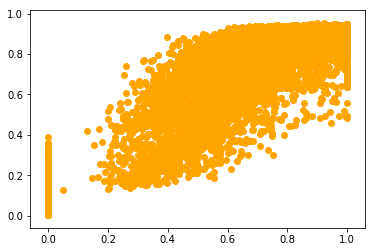

In [ ]:

#plt.scatter(x,pred,colour='yellow')
#plt.plot(r_sq, color = 'yellow')
plt.scatter(y_real,pred, color ='orange')
plt.show()


In [ ]:
y_mean = np.mean()

## Calculating metrics

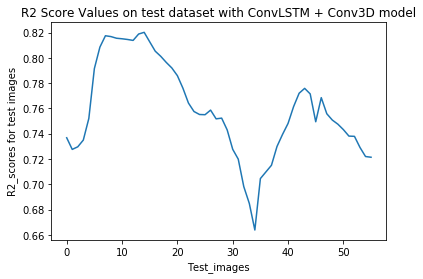

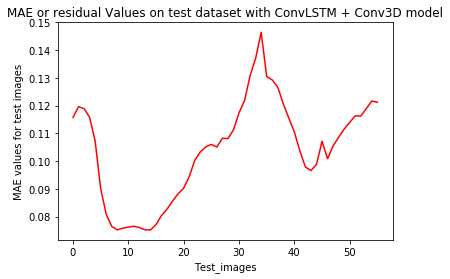

Text(0.5,1,'MSE Values on test dataset with ConvLSTM + Conv3D model')

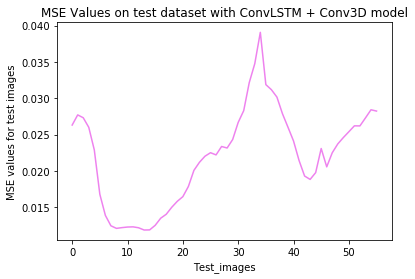

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = x_test
label = y_test
predicted =[]
true = []
R2 =[]
res = []
MSE =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i][0].reshape(190,124)
    test = framed.reshape(1,1,190,124,1)
    pred = model.predict(test)
    pred = pred.reshape(190,124)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    err = mse(y_real,pred)
    MSE.append(err)
    res.append(residual)
    predicted.append(pred)
    true.append(y_real)
    R2.append(r2)
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with ConvLSTM + Conv3D model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with ConvLSTM + Conv3D model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with ConvLSTM + Conv3D model")

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = x_test
label = y_test
predicted =[]
true = []
R2 =[]
res = []
MSE =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i][0].reshape(190,124)
    test = framed.reshape(1,1,190,124,1)
    pred = model.predict(test)
    pred = pred.reshape(190,124)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    err = mse(y_real,pred)
    MSE.append(err)
    res.append(residual)
    predicted.append(pred)
    true.append(y_real)
    R2.append(r2)

np.save("R2_score_convLSTM+conv3D_2.1.npy", R2)
np.save("MAE_for_ConvLSTM+ Conv3D_2.1.npy",res)
np.save("MSE_for_ConvLSTM+Conv3D_2.1.npy",MSE)
np.save("Predicted_outputs_ConvLSTM+Conv3D_2.1.npy", predicted)


# r2 = r2_score(y_real, pred)
print(len(R2))
print('r2 score for test data on model is: \n', R2)

56
r2 score for test data on model is: 
 [0.8073175701323676, 0.8251750907536042, 0.8224152095092531, 0.8107972363704404, 0.7789325548785869, 0.6796708664736253, 0.5687652148221054, 0.4868519709840127, 0.43346122561088557, 0.42090770561927615, 0.42443150229872334, 0.42445138653072095, 0.41256720249097817, 0.4229381885995474, 0.44234651419401944, 0.4231804512606754, 0.4699007614615398, 0.5172804625975578, 0.5809389077884852, 0.625649168684577, 0.6489781788541796, 0.6834676023514547, 0.7294716499564982, 0.7539807569907604, 0.771958602493968, 0.7878849597685763, 0.7921237714857405, 0.8005101461354521, 0.8001459057826563, 0.8007980412376356, 0.8103319432290863, 0.8171308303178534, 0.8334501368035729, 0.8467779756398192, 0.8632226039853311, 0.8227938577907713, 0.8288121785641804, 0.8211551605513105, 0.788499341095668, 0.7668704572334495, 0.7413044169391605, 0.6964680591297753, 0.6466070739657668, 0.6377715370556296, 0.65717760808211, 0.7326534349697047, 0.6887921257432573, 0.738094090124802

In [ ]:
R2[32:35], res[32:35], MSE[32:35]

([0.8334501368035729, 0.8467779756398192, 0.8632226039853311],
 [0.07303050926665298, 0.06865358454923108, 0.06339287917060174],
 [0.01296916181223915, 0.011827658293455801, 0.01053523304207846])

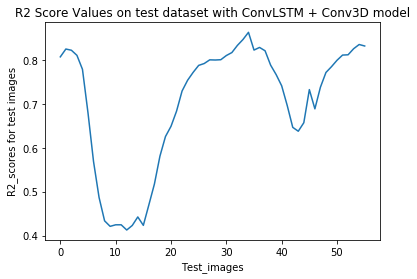

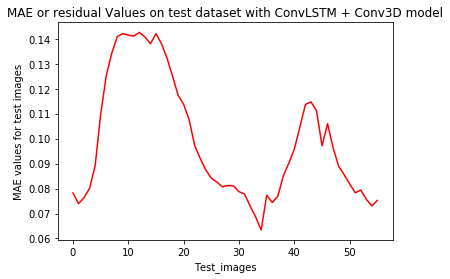

Text(0.5,1,'MSE Values on test dataset with ConvLSTM + Conv3D model')

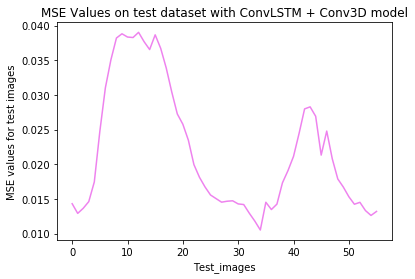

In [ ]:
R2 = np.load("R2_score_convLSTM+conv3D_2.1.npy")
res = np.load("MAE_for_ConvLSTM+ Conv3D_2.1.npy")
MSE = np.load("MSE_for_ConvLSTM+Conv3D_2.1.npy")
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with ConvLSTM + Conv3D model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with ConvLSTM + Conv3D model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with ConvLSTM + Conv3D model")

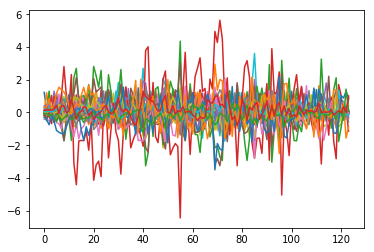

(124, 124)

In [ ]:
slope = mod.coef_
plt.plot(slope)
plt.show()
slope.shape

In [ ]:
example = x_train[np.random.choice(range(len(x_test)), size=1)[0]]
frames = example[:3, ...]
original_frames = example[1:, ...]

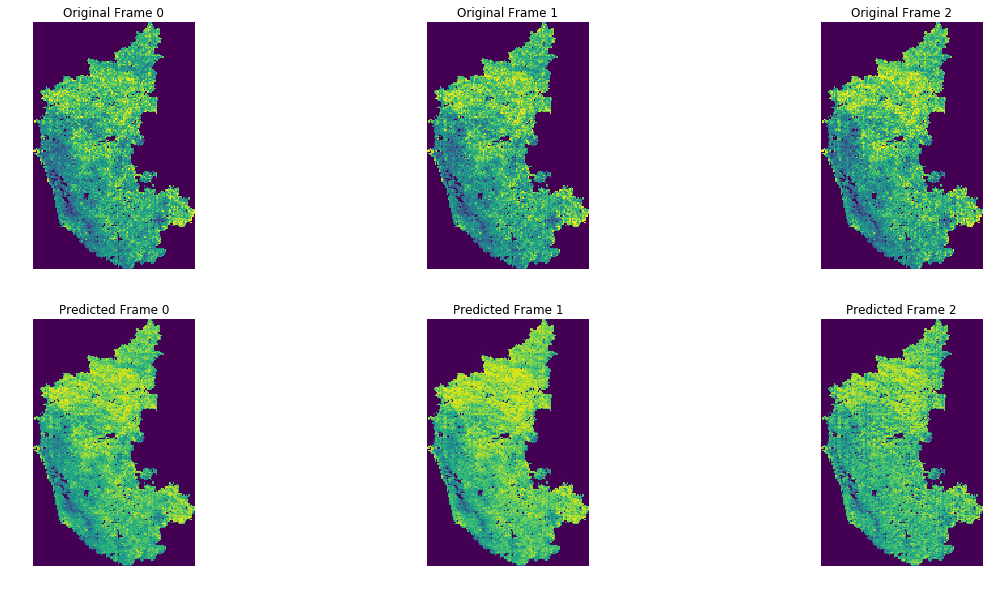

In [ ]:
# Predict a new set of 10 frames.
example = x_test[np.random.choice(range(len(x_test)), size=1)[0]]
frames = example[:3, ...]
original_frames = example[1:, ...]
for _ in range(3):
    # Extract the model's prediction and post-process it.
    new_prediction = model.predict(np.expand_dims(frames, axis=0))
    new_prediction = np.squeeze(new_prediction, axis=0)
    predicted_frame = np.expand_dims(new_prediction[-1, ...], axis=0)

    # Extend the set of prediction frames.
    frames = np.concatenate((frames, predicted_frame), axis=0)
#print(frames.shape)
# Construct a figure for the original and new frames.
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Plot the original frames.
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(original_frames[idx]))
    ax.set_title(f"Original Frame {idx}")
    ax.axis("off")

# Plot the new frames.
new_frames = frames[3:, ...]
for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(new_frames[idx]))
    ax.set_title(f"Predicted Frame {idx}")
    ax.axis("off")

# Display the figure.
plt.show()

In [ ]:
# unscaling values
def unscale(mat, VHI_test):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(VHI_test)
  unscaled = scaler.inverse_transform(mat.reshape(190,124))
  return unscaled

In [ ]:
def colorcoding(mat):
  for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
      #print(mat[i][j])
      if  mat[i][j] >80:
        mat[i][j] = 255
      # elif (mat[i][j]<80) &(mat[i][j] >70):             # Abnormally Dry
      #   mat[i][j]= 128
      elif (mat[i][j]<80) &(mat[i][j] >60):             # Abnormally Dry
        mat[i][j]= 128
      # elif (mat[i][j]<60) &(mat[i][j] >50):             # Abnormally Dry
      #   mat[i][j]= 64
      elif (mat[i][j]<60) &(mat[i][j] >40):             # Abnormally Dry
        mat[i][j]= 64
      # elif (mat[i][j]<40) &(mat[i][j] >30):             # Abnormally Dry
      #   mat[i][j]= 16
      elif (mat[i][j]<40) &(mat[i][j]>20):              # Moderate drought
        mat[i][j] = 32
      # elif (mat[i][j]<20) & (mat[i][j]>10):             # Severe drought
      #   mat[i][j] = 4
      elif (mat[i][j])<20:                              # Extreme  drought
        mat[i][j]= 0
  return mat

In [ ]:
#real unscaled data
VHI_train = np.loadtxt(r"F:\Jyoti Shukla -MS\karnataka dataset/Train_AVHRR_data_1981_2022.txt").reshape(1900,190,124)
VHI_test = np.loadtxt(r"F:\Jyoti Shukla -MS\karnataka dataset\Test_AVHRR_data_1981_2022.txt").reshape(61,190,124)
VHI_train = np.where(VHI_train<0,0,VHI_train)
VHI_test = np.where(VHI_test<0,0,VHI_test)
print(VHI_train.shape, VHI_test.shape)
print(np.max(VHI_train), np.min(VHI_train), np.max(VHI_test),np.min(VHI_test))

(1900, 190, 124) (61, 190, 124)
100.0 0.0 100.0 0.0


In [ ]:
x = VHI_train[:-1]
y = VHI_train[1:]
np.savez("F:\Jyoti Shukla -MS\karnataka dataset/paired_unscaled_arrays_train_AVHRR_data.npz",x = x , y = y)

x = VHI_test[:-1]
y = VHI_test[1:]
np.savez("F:\Jyoti Shukla -MS\karnataka dataset/paired_unscaled_arrays_test_AVHRR_data.npz",x = x , y = y)

In [ ]:
data_train = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset/paired_unscaled_arrays_train_AVHRR_data.npz")
data_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset/paired_unscaled_arrays_test_AVHRR_data.npz")
train_data, train_label = data_train[0], data_train[1]
test_data, test_label = data_test[0], data_test[1]
print(train_data.shape, train_label.shape, test_data.shape, test_label.shape)
vhi_train, vhi_train_label, n_steps = split_sequence(train_data, 4)
vhi_test, vhi_test_label, n_steps = split_sequence(test_data,4)
print("Training Dataset Shapes: " + str(vhi_train.shape) + ", " + str(vhi_train_label.shape))
print("Validation Dataset Shapes: " + str(vhi_test.shape) + ", " + str(vhi_test_label.shape))

(1899, 190, 124) (1899, 190, 124) (60, 190, 124) (60, 190, 124)
Training Dataset Shapes: (1895, 4, 190, 124), (1895, 4, 190, 124)
Validation Dataset Shapes: (56, 4, 190, 124), (56, 4, 190, 124)


In [ ]:
(original_frames[0]).shape,np.squeeze(original_frames[0]).shape

((190, 124, 1), (190, 124))

In [ ]:
ix = np.random.choice(range(len(x_test)), size=1)[0]
print(ix)
example = x_test[ix]
print(example.shape)
frames = example[:3, ...]
original_frames = example[1:, ...]
np.unique(x_test[ix][2]),np.unique(frames[2]),np.unique(original_frames[1])

40
(4, 190, 124, 1)


(array([0.        , 0.0042    , 0.0062    , ..., 0.99845103, 1.        ,
        1.        ]),
 array([0.        , 0.0042    , 0.0062    , ..., 0.99845103, 1.        ,
        1.        ]),
 array([0.        , 0.0042    , 0.0062    , ..., 0.99845103, 1.        ,
        1.        ]))

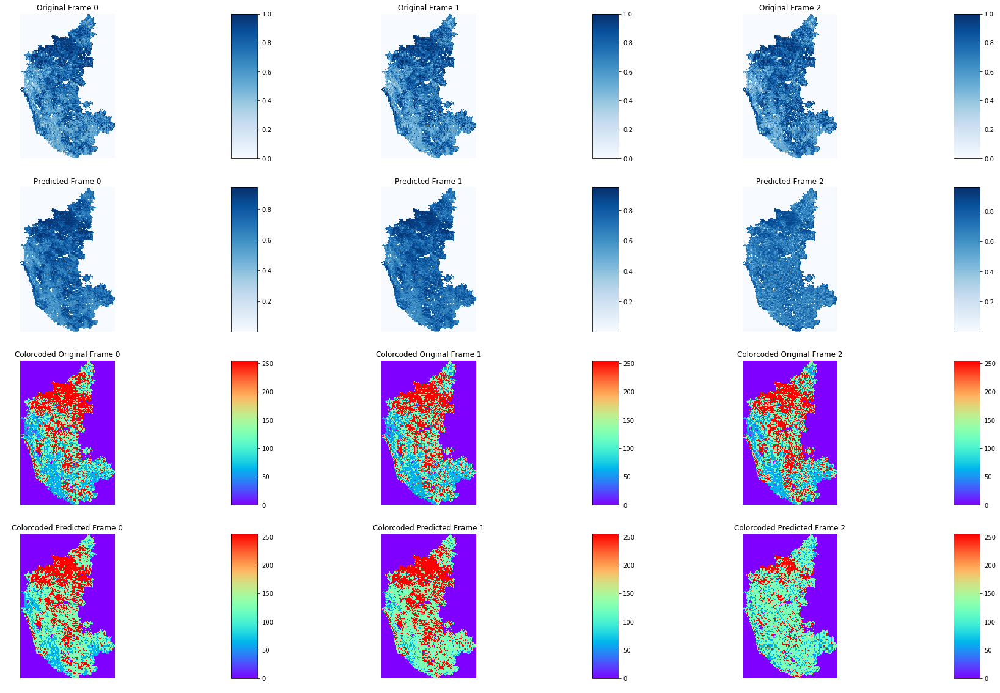

In [ ]:
# Predict a new set of 10 frames.
ix = np.random.choice(range(len(x_test)), size=1)[0]
example = x_test[ix]
frames = example[:3, ...]
original_frames = example[1:, ...]
for _ in range(3):
    # Extract the model's prediction and post-process it.
    new_prediction = model.predict(np.expand_dims(frames, axis=0))
    new_prediction = np.squeeze(new_prediction, axis=0)
    predicted_frame = np.expand_dims(new_prediction[-1, ...], axis=0)

    # Extend the set of prediction frames.
    frames = np.concatenate((frames, predicted_frame), axis=0)
#print(frames.shape)
# Construct a figure for the original and new frames.
fig, axes = plt.subplots(4, 3, figsize=(30, 20))

# Plot the original frames.
for idx, ax in enumerate(axes[0]):
    pos = ax.imshow(np.squeeze(original_frames[idx]), cmap="Blues")
    ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    fig.colorbar(pos, ax = ax, cax =cax)
    ax.axis("off")

# Plot the new frames.
new_frames = frames[3:, ...]
for idx, ax in enumerate(axes[1]):
    pos =ax.imshow(np.squeeze(new_frames[idx]), cmap="Blues")
    ax.set_title(f"Predicted Frame {idx}")
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    fig.colorbar(pos, ax = ax, cax =cax)
    ax.axis("off")

for idx, ax in enumerate(axes[2]):
    orig = unscale(np.squeeze(original_frames[idx]),vhi_test_label[ix][idx])
    colorcoded = colorcoding(orig)
    pos= ax.imshow(colorcoded, cmap='rainbow')
    ax.set_title(f"Colorcoded Original Frame {idx}")
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    fig.colorbar(pos, ax = ax, cax =cax)
    ax.axis("off")

new_frames = frames[3:, ...]
for idx, ax in enumerate(axes[3]):
    pred = unscale(np.squeeze(new_frames[idx]), vhi_test_label[ix][idx-3])
    colorcoded = colorcoding(pred)
    pos = ax.imshow(colorcoded, cmap='rainbow')
    ax.set_title(f"Colorcoded Predicted Frame {idx}")
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    fig.colorbar(pos, ax = ax, cax =cax)
    ax.axis("off")

# Display the figure.
plt.show()

In [ ]:
ix

53

## ConvLSTM with conv2D

In [ ]:
# Construct the input layer with no definite frame size.
inp = layers.Input(shape=(None, *x_train.shape[2:]))

# We will construct 3 `ConvLSTM2D` layers with Group normalizationgroups=,
# followed by a `Conv3D` layer for the spatiotemporal outputs.
x = layers.ConvLSTM2D(
    filters=8,
    kernel_size=(2, 2),
    padding="same",
    return_sequences=True,
    activation="relu",
)(inp)
x = tfa.layers.GroupNormalization(groups=4)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(2, 2),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = tfa.layers.GroupNormalization(groups=8)(x)
#x = layers.MaxPooling3D((2, 2, 2), padding='same')(x)
x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(2, 2),
    padding="same",
    return_sequences=False,
    activation="relu",
)(x)
x = tfa.layers.GroupNormalization(groups=32)(x)
x = layers.Dropout(0.3)(x)
#x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(
    filters=8,
    kernel_size=(2, 2),
    padding="same",
    activation="relu",
)(x)
# x = tfa.layers.GroupNormalization(groups=)(x)
# #x = layers.UpSampling2D((2, 2))(x)
# x = layers.Conv2D(
#     filters=32,
#     kernel_size=(3, 3),
#     padding="same",
#     activation="relu",
# )(x)
x = tfa.layers.GroupNormalization(groups=4)(x)
x = layers.Conv2D(
    filters=1,
    kernel_size=(2, 2),
    padding="same",
    activation="sigmoid",
)(x)
# x = layers.Conv3D(
#     filters=1, kernel_size=(3, 3, 3), activation="sigmoid", padding="same"
# )(x)
huber_loss = tf.keras.losses.Huber(delta=0.15)
# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, x)
model.compile(
    loss=huber_loss, optimizer=keras.optimizers.SGD(learning_rate=0.25),metrics=[tf.keras.metrics.mse]
)
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, None, 192, 256, 1 0         
_________________________________________________________________
conv_lst_m2d_10 (ConvLSTM2D) (None, None, 192, 256, 8) 1184      
_________________________________________________________________
group_normalization (GroupNo (None, None, 192, 256, 8) 16        
_________________________________________________________________
conv_lst_m2d_11 (ConvLSTM2D) (None, None, 192, 256, 16 6208      
_________________________________________________________________
group_normalization_1 (Group (None, None, 192, 256, 16 32        
_________________________________________________________________
conv_lst_m2d_12 (ConvLSTM2D) (None, 192, 256, 64)      82176     
_________________________________________________________________
group_normalization_2 (Group (None, 192, 256, 64)      128 

In [ ]:
inp.shape

TensorShape([None, None, 192, 256, 1])

In [ ]:
y_train.shape

(1997, 192, 256, 1)

In [ ]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 50
batch_size = 1

# Fit the model to the training data.
history= model.fit(
    x_train,
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    callbacks=[early_stopping, reduce_lr],
)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv2d_AVHRR_model_rajasthan_history.npy", history.history)
model.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv2d_AVHRR_model_rajasthan.h5")

Epoch 1/50
1997/1997 [==============================] - 152s 73ms/step - loss: 0.0045 - mean_squared_error: 0.0116 - val_loss: 0.0025 - val_mean_squared_error: 0.0056
Epoch 2/50
1997/1997 [==============================] - 150s 75ms/step - loss: 0.0025 - mean_squared_error: 0.0054 - val_loss: 0.0020 - val_mean_squared_error: 0.0043
Epoch 3/50
1997/1997 [==============================] - 150s 75ms/step - loss: 0.0020 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0037
Epoch 4/50
1997/1997 [==============================] - 149s 75ms/step - loss: 0.0018 - mean_squared_error: 0.0038 - val_loss: 0.0018 - val_mean_squared_error: 0.0038
Epoch 5/50
1997/1997 [==============================] - 151s 75ms/step - loss: 0.0015 - mean_squared_error: 0.0033 - val_loss: 0.0013 - val_mean_squared_error: 0.0027
Epoch 6/50
1997/1997 [==============================] - 151s 75ms/step - loss: 0.0013 - mean_squared_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.002

In [ ]:
np.save("F:\Jyoti Shukla -MS\codes\AVHRR codes/convlstm+conv2d_history.npy", history.history)
history.history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model_conv2 = load_model(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv2d_AVHRR_model_rajasthan.h5")
history_conv2 = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/convlstm_conv2d_AVHRR_model_rajasthan_history.npy",allow_pickle=True).item()
history_conv2.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

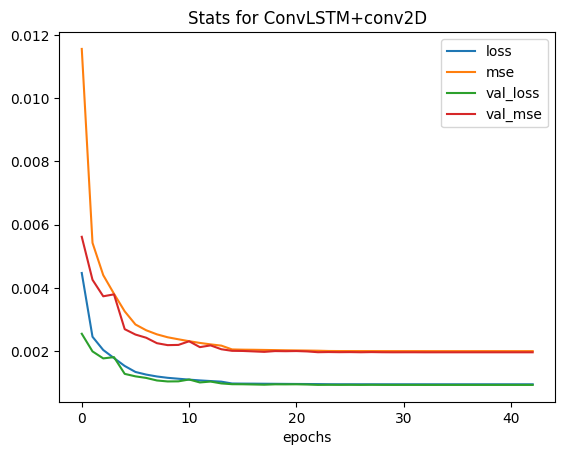

In [ ]:
# Results of updated model6

plt.plot(history_conv2['loss'])
plt.plot(history_conv2['mean_squared_error'])
plt.plot(history_conv2['val_loss'])
plt.plot(history_conv2['val_mean_squared_error'])

plt.title('Stats for ConvLSTM+conv2D')
plt.xlabel('epochs')
plt.legend(['loss','mse','val_loss','val_mse'])
plt.show()

In [ ]:
x_test[1].shape

(4, 192, 128, 1)

In [ ]:
y_test[40].shape

(4, 192, 128, 1)

0.8631313393178982


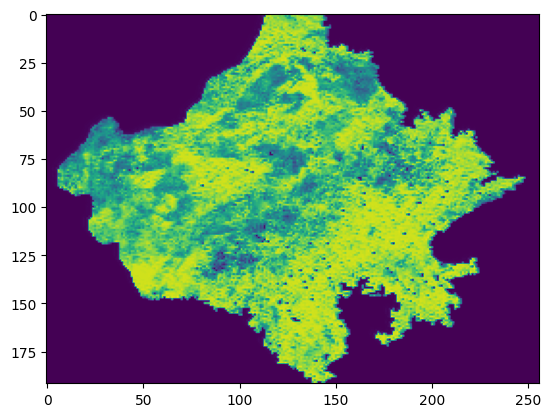

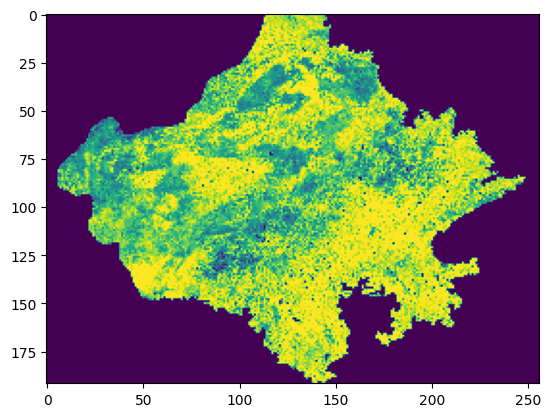

In [ ]:
model = model_conv2
from sklearn.metrics import r2_score
framed = x_test[40][1:2,...]
pred = model.predict(np.expand_dims(framed, axis=0))
y_real = y_test[40].reshape(192,256)
pred = pred.reshape(192,256)
r2 = r2_score(y_real,pred)
print(r2)
plt.imshow(pred.reshape(192,256))
plt.figure()
plt.imshow(y_real.reshape(192,256))

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = x_test
label = y_test
predicted_mod =[]
true = []
R2_mod =[]
res_mod = []
mse_mod =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i].reshape(192,256)
    test = framed.reshape(1,1,192,256,1)
    pred = model.predict(test)
    pred = pred.reshape(192,256)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    res_mod.append(residual)
    err = mse(y_real,pred)
    mse_mod.append(err)
    predicted_mod.append(pred)
    true.append(y_real)
    R2_mod.append(r2)

np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_ConvLSTM+Conv2D_rajasthan.npy", R2_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_ConvLSTM+Conv2D_rajasthan.npy",res_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_ConvLSTM+Conv2D_rajasthan.npy",mse_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/Predicted_outputs_ConvLSTM+Conv2D_rajasthan.npy", predicted_mod)
# r2 = r2_score(y_real, pred)
# print(len(R2_mod))
print('r2 score for test data on model is: \n', R2_mod)

r2 score for test data on model is: 
 [0.7820166290069168, 0.7645165105827629, 0.7653006654047664, 0.7410411235618402, 0.7175841790577694, 0.7537526563869642, 0.7732389887573465, 0.8014149762153263, 0.8465943615559395, 0.8561390253638044, 0.8325836377601067, 0.8160374791155769, 0.7950753907546222, 0.7924029901629606, 0.7975854301756453, 0.7898768539082528, 0.7738957703709932, 0.7764446531377842, 0.7891708238688102, 0.7860702120467538, 0.7824666478692894, 0.7727734999757275, 0.7487140194241285, 0.6753466872434348, 0.6535137165173335, 0.7984471391802295, 0.860328192579699, 0.8704283832279438, 0.8738280606197172, 0.8801760196480802, 0.867854818140386, 0.840090311744318, 0.8418406556940368, 0.8480522028702581, 0.8338754258186283, 0.8132536035140918, 0.7683984937571506, 0.7427405037049442, 0.7873651794006421, 0.7482239684876111, 0.7563886963767563, 0.856169420330715, 0.8665917749142129, 0.8630993171488116, 0.869241064705804, 0.854329438796827, 0.8492250748493813, 0.8495850070192379, 0.84327

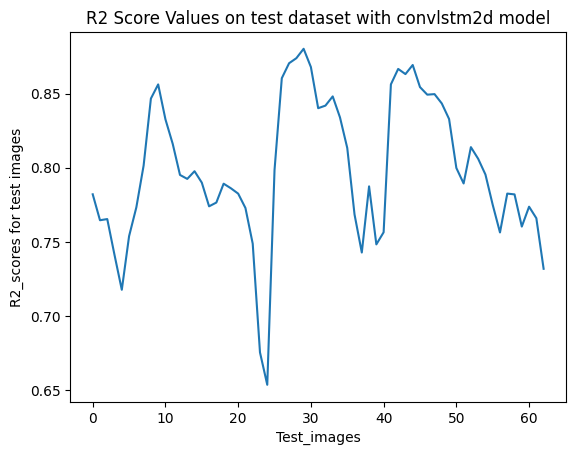

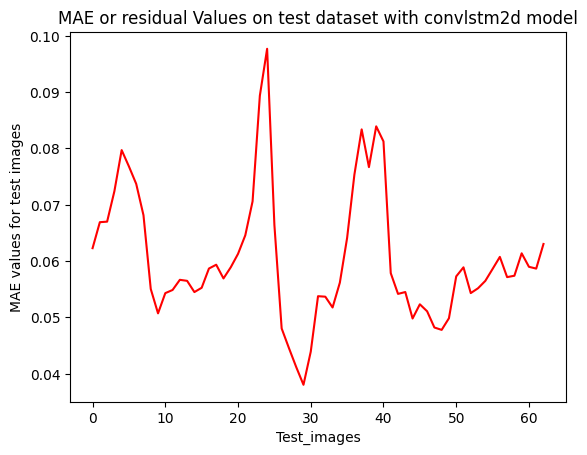

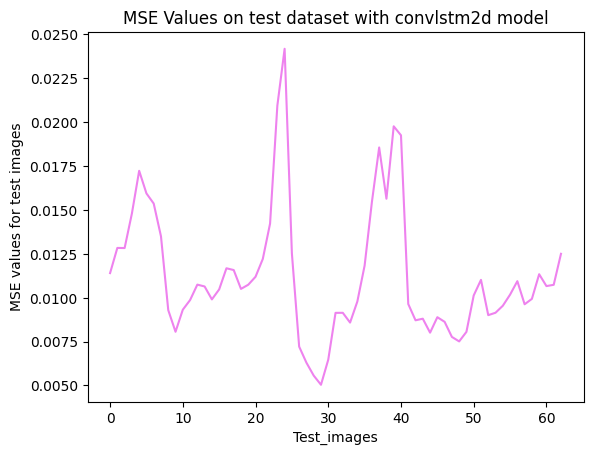

In [ ]:
R2_convlstm2d = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_ConvLSTM+Conv2D_rajasthan.npy")
error_convlstm2d = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_ConvLSTM+Conv2D_rajasthan.npy")
MSE_convlstm2d = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_ConvLSTM+Conv2D_rajasthan.npy")
plt.plot(R2_convlstm2d)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with convlstm2d model")
plt.show()
plt.plot(error_convlstm2d,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with convlstm2d model")
plt.show()
plt.plot(MSE_convlstm2d, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with convlstm2d model")
plt.show()

In [ ]:
np.mean(R2_convlstm2d), np.max(R2_convlstm2d), np.mean(MSE_convlstm2d), np.mean(error_convlstm2d)

(0.7988976414361019, 0.8801760196480802, 0.011275464, 0.06045104)

## *Conv3D*

In [ ]:
from keras.layers import Conv3D, MaxPool3D, Flatten, Dense, LSTM
from keras.layers import Dropout, Input, BatchNormalization
from sklearn.metrics import confusion_matrix, accuracy_score
# from plotly.offline import iplot, init_notebook_mode
from keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adadelta
# import plotly.graph_objs as go
from matplotlib.pyplot import cm
from keras.models import Model
import numpy as np
import keras
import h5py


In [ ]:
## input layer
input_layer = Input(shape=(None, *x_train.shape[2:]))

## convolutional layers
conv_layer1 = Conv3D(filters=8, kernel_size=(3, 3, 3), activation='relu',padding="same")(input_layer)
conv_layer2 = Conv3D(filters=16, kernel_size=(3, 3, 3), activation='relu',padding="same")(conv_layer1)

## add max pooling to obtain the most imformatic features
#pooling_layer1 = MaxPool3D(pool_size=(2, 2, 2))(conv_layer2)

conv_layer3 = Conv3D(filters=64, kernel_size=(3, 3, 3), activation='relu',padding="same")(conv_layer2)
conv_layer4 = Conv3D(filters=1, kernel_size=(3, 3, 3), activation='sigmoid',padding="same")(conv_layer3)
# pooling_layer2 = MaxPool3D(pool_size=(2, 2, 2))(conv_layer4)
# out= LSTM(4)(conv_layer4)

# ## perform batch normalization on the convolution outputs before feeding it to MLP architecture
# pooling_layer2 = BatchNormalization()(pooling_layer2)
# flatten_layer = Flatten()(pooling_layer2)

# ## create an MLP architecture with dense layers : 4096 -> 512 -> 10
# ## add dropouts to avoid overfitting / perform regularization
# dense_layer1 = Dense(units=2048, activation='relu')(flatten_layer)
# dense_layer1 = Dropout(0.4)(dense_layer1)
# dense_layer2 = Dense(units=512, activation='relu')(dense_layer1)
# dense_layer2 = Dropout(0.4)(dense_layer2)
# output_layer = Dense(units=10, activation='softmax')(dense_layer2)

## define the model with input layer and output layer
model = Model(inputs=input_layer, outputs=conv_layer4)
# huber_loss = tf.keras.losses.Huber(delta=0.15)
model.compile(loss='mae', optimizer='sgd', metrics=[tf.keras.metrics.mse])
model.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, None, 192, 256, 1 0         
_________________________________________________________________
conv3d_28 (Conv3D)           (None, None, 192, 256, 8) 224       
_________________________________________________________________
conv3d_29 (Conv3D)           (None, None, 192, 256, 16 3472      
_________________________________________________________________
conv3d_30 (Conv3D)           (None, None, 192, 256, 64 27712     
_________________________________________________________________
conv3d_31 (Conv3D)           (None, None, 192, 256, 1) 1729      
Total params: 33,137
Trainable params: 33,137
Non-trainable params: 0
_________________________________________________________________


In [ ]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 50
batch_size = 1

# Fit the model to the training data.
history= model.fit(
    x_train,
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    callbacks=[early_stopping, reduce_lr],
)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/conv3d_AVHRR_model_rajasthan_history.npy", history.history)
model.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/conv3d_AVHRR_model_rajasthan.h5")

Epoch 1/50
1997/1997 [==============================] - 23s 11ms/step - loss: 0.1051 - mean_squared_error: 0.0290 - val_loss: 0.0571 - val_mean_squared_error: 0.0112
Epoch 2/50
1997/1997 [==============================] - 23s 11ms/step - loss: 0.0454 - mean_squared_error: 0.0074 - val_loss: 0.0507 - val_mean_squared_error: 0.0092
Epoch 3/50
1997/1997 [==============================] - 23s 12ms/step - loss: 0.0409 - mean_squared_error: 0.0062 - val_loss: 0.0480 - val_mean_squared_error: 0.0083
Epoch 4/50
1997/1997 [==============================] - 24s 12ms/step - loss: 0.0387 - mean_squared_error: 0.0056 - val_loss: 0.0463 - val_mean_squared_error: 0.0077
Epoch 5/50
1997/1997 [==============================] - 23s 12ms/step - loss: 0.0368 - mean_squared_error: 0.0051 - val_loss: 0.0440 - val_mean_squared_error: 0.0070
Epoch 6/50
1997/1997 [==============================] - 23s 12ms/step - loss: 0.0347 - mean_squared_error: 0.0046 - val_loss: 0.0410 - val_mean_squared_error: 0.0061
Epoc

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model_conv3 = load_model(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/conv3d_AVHRR_model_rajasthan.h5")
history_conv3 = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/conv3d_AVHRR_model_rajasthan_history.npy",allow_pickle=True).item()
history_conv3.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

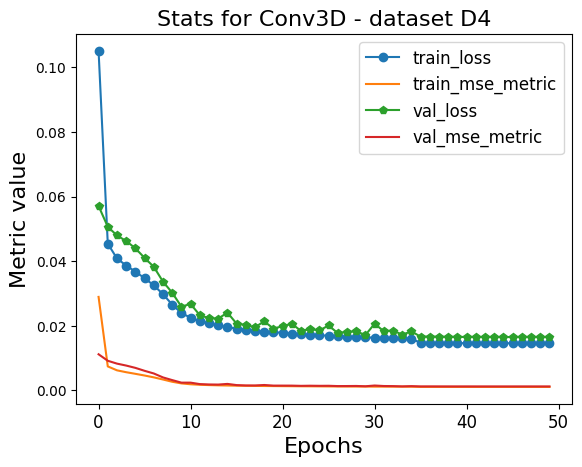

In [ ]:
# Results of updated model6

plt.plot(history_conv3['loss'],'-o')
plt.plot(history_conv3['mean_squared_error'])
plt.plot(history_conv3['val_loss'],'-p')
plt.plot(history_conv3['val_mean_squared_error'])

plt.title('Stats for Conv3D - dataset D4', fontsize=16)
plt.xticks(fontsize=12)
plt.xticks(fontsize=12)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Metric value', fontsize=16)
plt.legend(['train_loss','train_mse_metric','val_loss','val_mse_metric'], fontsize=12)
plt.show()

mse 0.032534897
r2 score is: 0.5824318661849874 

discrete values, predicted and real respectively: 0.01616843 0.0


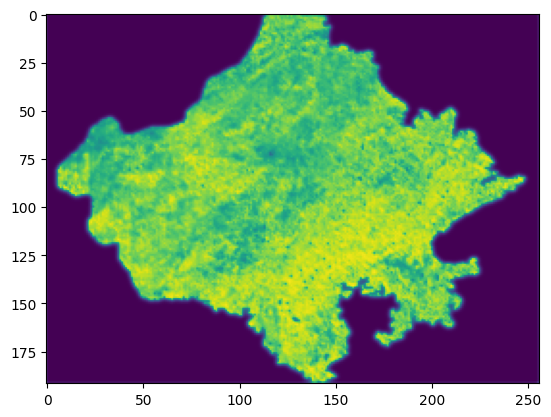

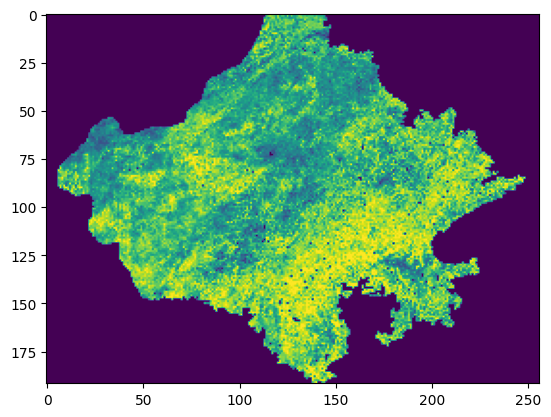

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error as mse
framed = x_test[36][:1,...]
pred = model_conv3.predict(np.expand_dims(framed, axis=0))
y_real = y_test[36][0]
pred = pred.reshape(192,256,1)
plt.imshow(pred.reshape(192,256))
plt.figure()
plt.imshow(y_real.reshape(192,256))
r2 = r2_score(y_real.reshape(192,256),pred.reshape(192,256))
mse = mse(y_real.reshape(192,256),pred.reshape(192,256))
print("mse",mse)
print("r2 score is:", r2,"\n")
pred = pred.reshape(192,256)
y_real = y_real.reshape(192,256)
print("discrete values, predicted and real respectively:",(pred.reshape(192,256))[50][30],(y_real.reshape(192,256))[50][30])

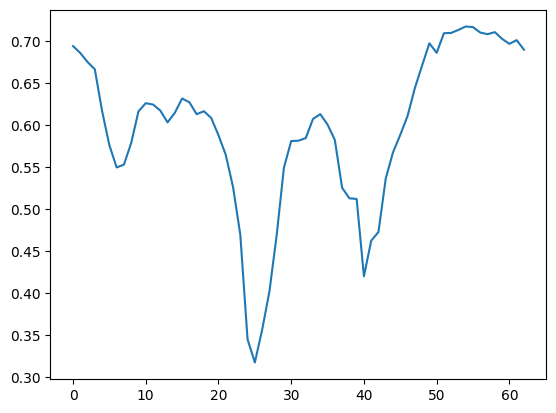

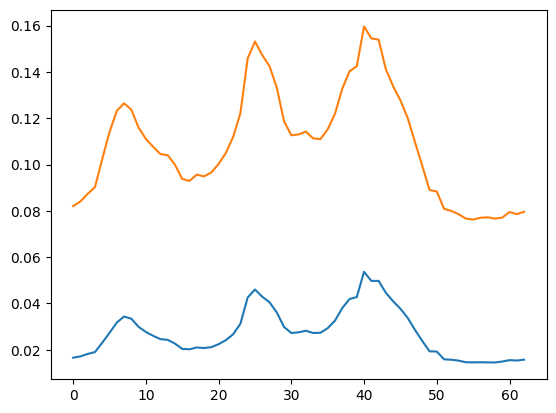

In [ ]:
from sklearn.metrics import mean_squared_error as mse
data = x_test
label = y_test
predicted =[]
true = []
R2 =[]
res = []
MSE =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i][0]
    y_real = label[i][0].reshape(192,256)
    test = framed.reshape(1,1,192,256,1)
    pred = model_conv3.predict(test)
    pred = pred.reshape(192,256)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    err = mse(y_real,pred.reshape(192,256))
    MSE.append(err)
    res.append(residual)
    predicted.append(pred)
    true.append(y_real)
    R2.append(r2)
plt.plot(R2)
plt.show()
plt.plot(MSE)
plt.show
plt.plot(res)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/r2_score_conv3d_rajasthan.npy", R2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/mse_conv3d_rajasthan.npy", MSE)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/mae_conv3d_rajasthan.npy", res)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/predicted_conv3d_rajasthan.npy", predicted)


In [ ]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.5958114103640684, 0.717869010037786, 0.027382525, 0.10888865)

## Different convlstm models

In [ ]:
from tensorflow.keras.layers import AveragePooling3D, BatchNormalization
def fn_get_model_convLSTM_2():

    model = Sequential()

    model.add(ConvLSTM2D(filters=32, kernel_size=(2, 2),padding='same',
                         input_shape=(None, 256, 256, 1),
                         return_sequences=True,
                         go_backwards=True,
                         activation='tanh', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.3, recurrent_dropout=0.2
                         ))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2,2,2),padding='same'))
    model.add(ConvLSTM2D(filters=8, kernel_size=(3, 3),padding='same',
                         return_sequences=True,
                         go_backwards=True,
                         activation='tanh', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.3, recurrent_dropout=0.2
                         ))
    model.add(BatchNormalization())
    model.add(UpSampling3D(size=(2,2,2)))
    model.add(ConvLSTM2D(filters=8, kernel_size=(3, 3),padding='same',
                         return_sequences=False,
                         go_backwards=True,
                         activation='tanh', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.3, recurrent_dropout=0.2
                         ))
    model.add(BatchNormalization())

    model.add(Conv2D(filters=1, kernel_size=(1, 1),padding='same',
                   activation='sigmoid',
                   data_format='channels_last'))
    model.compile(loss='mean_squared_error', optimizer='sgd',metrics=[tf.keras.metrics.CosineSimilarity(axis=1)])
    print(model.summary())
    return model

In [ ]:
model = fn_get_model_convLSTM_2()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_20 (ConvLSTM2D)  (None, None, 256, 256, 3  17024    
                             2)                                  
                                                                 
 batch_normalization_20 (Bat  (None, None, 256, 256, 3  128      
 chNormalization)            2)                                  
                                                                 
 max_pooling3d_6 (MaxPooling  (None, None, 128, 128, 3  0        
 3D)                         2)                                  
                                                                 
 conv_lstm2d_21 (ConvLSTM2D)  (None, None, 128, 128, 8  11552    
                             )                                   
                                                                 
 batch_normalization_21 (Bat  (None, None, 128, 128, 8

In [ ]:
from keras.callbacks import History
def fn_run_model(model, X, y, X_val, y_val, batch_size=8, nb_epoch=15,verbose=2,is_graph=False):
    history = History()
    history = model.fit(X, y, batch_size=batch_size,
                        epochs=nb_epoch,verbose=verbose, validation_data=(X_val, y_val))
    if is_graph:
        fig, ax1 = plt.subplots(1,1)
        ax1.plot(history.history["val_loss"])
        ax1.plot(history.history["loss"])

In [ ]:
#fn_run_model(model,x_train,y_train, x_test,y_test, batch_size=8, nb_epoch=10, verbose=2, is_graph=True)
model.fit(x_train,y_train, batch_size =8,epochs = 10,validation_data=(x_test, y_test))

Epoch 1/10
11/11 [==============================] - 38s 2s/step - loss: 0.1223 - cosine_similarity: 0.8073 - val_loss: 0.0575 - val_cosine_similarity: 0.9045
Epoch 2/10
11/11 [==============================] - 22s 2s/step - loss: 0.1188 - cosine_similarity: 0.8111 - val_loss: 0.0572 - val_cosine_similarity: 0.9045
Epoch 3/10
11/11 [==============================] - 22s 2s/step - loss: 0.1144 - cosine_similarity: 0.8156 - val_loss: 0.0570 - val_cosine_similarity: 0.9045
Epoch 4/10
11/11 [==============================] - 22s 2s/step - loss: 0.1113 - cosine_similarity: 0.8202 - val_loss: 0.0567 - val_cosine_similarity: 0.9045
Epoch 5/10
11/11 [==============================] - 22s 2s/step - loss: 0.1069 - cosine_similarity: 0.8253 - val_loss: 0.0565 - val_cosine_similarity: 0.9045
Epoch 6/10
11/11 [==============================] - 22s 2s/step - loss: 0.1024 - cosine_similarity: 0.8306 - val_loss: 0.0563 - val_cosine_similarity: 0.9045
Epoch 7/10
11/11 [==============================] - 

In [ ]:
pred = model.predict(x_test)

In [ ]:
from keras.layers.convolutional import UpSampling3D
from keras.layers.pooling import MaxPooling3D
def fn_get_model_convLSTM_tframe_4():

    model = Sequential()
    model.add(ConvLSTM2D(filters=16, kernel_size=(3, 3),
                         input_shape=(None, 256, 256, 1), padding='same', return_sequences=True,
                         activation='relu', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.3, recurrent_dropout=0.3))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size = (2,2,2), padding='same'))

    model.add(ConvLSTM2D(filters=8, kernel_size=(2, 2), padding='same', return_sequences=True,
                         activation='relu', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.4, recurrent_dropout=0.3))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size = (2,2,2), padding='same'))
    model.add(ConvLSTM2D(filters=8, kernel_size=(2,2), padding='same', return_sequences=True,
                         activation='relu', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.4, recurrent_dropout=0.3))
    model.add(BatchNormalization())
    model.add(UpSampling3D(size=(4,4,4)))

    model.add(ConvLSTM2D(filters=8, kernel_size=(2, 2), padding='same', return_sequences=False,
                         activation='relu', recurrent_activation='hard_sigmoid',
                         kernel_initializer='glorot_uniform', unit_forget_bias=True,
                         dropout=0.4, recurrent_dropout=0.3))
    model.add(BatchNormalization())

    model.add(Conv2D(filters=1, kernel_size=(1, 1),
                   activation='sigmoid',
                   padding='same', data_format='channels_last'))

    ### !!! try go_backwards=True !!! ###
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=[tf.keras.metrics.CosineSimilarity(axis=1)])
    print(model.summary())

    return model

In [ ]:
model_1 = fn_get_model_convLSTM_tframe_4()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_27 (ConvLSTM2D)  (None, None, 256, 256, 1  9856     
                             6)                                  
                                                                 
 batch_normalization_27 (Bat  (None, None, 256, 256, 1  64       
 chNormalization)            6)                                  
                                                                 
 max_pooling3d_9 (MaxPooling  (None, None, 128, 128, 1  0        
 3D)                         6)                                  
                                                                 
 conv_lstm2d_28 (ConvLSTM2D)  (None, None, 128, 128, 8  3104     
                             )                                   
                                                                 
 batch_normalization_28 (Bat  (None, None, 128, 128, 8

In [ ]:
model_1.fit(x_train,y_train, batch_size =8,epochs = 10,validation_data=(x_test, y_test))

Epoch 1/10
11/11 [==============================] - 35s 2s/step - loss: 0.0931 - cosine_similarity: 0.8531 - val_loss: 0.0569 - val_cosine_similarity: 0.9045
Epoch 2/10
11/11 [==============================] - 14s 1s/step - loss: 0.0804 - cosine_similarity: 0.8669 - val_loss: 0.0560 - val_cosine_similarity: 0.9045
Epoch 3/10
11/11 [==============================] - 14s 1s/step - loss: 0.0725 - cosine_similarity: 0.8768 - val_loss: 0.0554 - val_cosine_similarity: 0.9045
Epoch 4/10
11/11 [==============================] - 14s 1s/step - loss: 0.0680 - cosine_similarity: 0.8832 - val_loss: 0.0548 - val_cosine_similarity: 0.9045
Epoch 5/10
11/11 [==============================] - 14s 1s/step - loss: 0.0661 - cosine_similarity: 0.8858 - val_loss: 0.0544 - val_cosine_similarity: 0.9045
Epoch 6/10
11/11 [==============================] - 14s 1s/step - loss: 0.0647 - cosine_similarity: 0.8878 - val_loss: 0.0541 - val_cosine_similarity: 0.9045
Epoch 7/10
11/11 [==============================] - 

In [ ]:
pred = model_1.predict(x_test)

array([[[0.44881225],
        [0.44881225],
        [0.44881225],
        ...,
        [0.44873774],
        [0.4487574 ],
        [0.45527452]],

       [[0.44881225],
        [0.44881225],
        [0.44881225],
        ...,
        [0.44873825],
        [0.44875762],
        [0.45527452]],

       [[0.44881254],
        [0.44881263],
        [0.44881207],
        ...,
        [0.448719  ],
        [0.44875133],
        [0.45527047]],

       ...,

       [[0.447951  ],
        [0.447951  ],
        [0.44795167],
        ...,
        [0.44940987],
        [0.44944102],
        [0.45519602]],

       [[0.44791177],
        [0.4479118 ],
        [0.44791254],
        ...,
        [0.44930193],
        [0.4494125 ],
        [0.45500648]],

       [[0.45174688],
        [0.45174694],
        [0.4517476 ],
        ...,
        [0.45258018],
        [0.45264295],
        [0.45723784]]], dtype=float32)

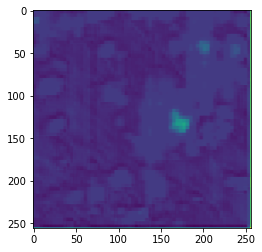

In [ ]:
plt.imshow(pred[12].reshape(256,256))
pred[12]

array([[[0.48982877],
        [0.42229389],
        [0.39844672],
        ...,
        [0.55214073],
        [0.47586127],
        [0.55111878]],

       [[0.48257639],
        [0.40776455],
        [0.3331807 ],
        ...,
        [0.55732828],
        [0.46868041],
        [0.57696428]],

       [[0.50013996],
        [0.39865   ],
        [0.32728507],
        ...,
        [0.62118773],
        [0.48862885],
        [0.51430524]],

       ...,

       [[0.45776756],
        [0.4078741 ],
        [0.42319239],
        ...,
        [0.1804819 ],
        [0.22802667],
        [0.36086264]],

       [[0.32292095],
        [0.28423992],
        [0.30027262],
        ...,
        [0.13355487],
        [0.21405866],
        [0.41041434]],

       [[0.36469325],
        [0.44842399],
        [0.51525989],
        ...,
        [0.16548328],
        [0.26114827],
        [0.3898487 ]]])

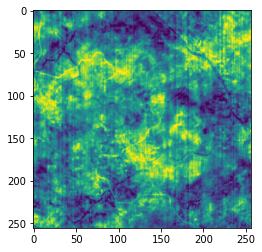

In [ ]:
plt.imshow(y_test[12].reshape(256,256))
y_test[12]

## *CONV2D*

In [ ]:
inp = layers.Input(shape=(4, *x_train.shape[2:]))
inp

<KerasTensor: shape=(None, 4, 192, 128, 1) dtype=float32 (created by layer 'input_2')>

In [ ]:
from tensorflow.keras.layers import Input
def fn_get_model_2D_timeD():

    t_frames, rows, cols = 4, 192, 128
    inp = layers.Input(shape=(4, *x_train.shape[2:]))
    #input_shape = (t_frames, rows, cols, 1)

    #inp = Input(shape=input_shape)
    inpN = BatchNormalization()(inp)

    c1 = Conv3D(filters=8, kernel_size= (5,5,5), strides=(1,1,1), activation='relu',
                kernel_initializer='glorot_uniform', padding='same')(inpN)
    c1 = BatchNormalization()(c1)
    # c1 = Conv3D(filters=8, kernel_size= (5,5,5), strides=(1,1,1), activation='relu',
    #             kernel_initializer='glorot_uniform', padding='same')(c1)
    # c1 = BatchNormalization()(c1)
    #pool_1 = MaxPooling3D(pool_size=(2,3,3))(c1)
    drop_1 = Dropout(0.25)(c1)

    c2 = Conv3D(filters=16, kernel_size= (3,3,3), strides=(1,1,1), activation='relu',
                kernel_initializer='glorot_uniform', padding='same')(drop_1)
    c2 = BatchNormalization()(c2)
    # c2 = Conv3D(filters=16, kernel_size= (3,3,3), strides=(1,1,1), activation='relu',
    #             kernel_initializer='glorot_uniform', padding='same')(c2)
    # c2 = BatchNormalization()(c2)
    # #pool_2 = MaxPooling3D(pool_size=(1,3,3))(c2)
    # drop_1 = Dropout(0.25)(c2)

    c3 = Conv3D(filters=32, kernel_size= (3,3,3), strides=(1,1,1), activation='relu',
                kernel_initializer='glorot_uniform', padding='same')(c2)
    c3 = BatchNormalization()(c3)
    # c3 = Conv3D(filters=32, kernel_size= (3,3,3), strides=(1,1,1), activation='relu',
    #             kernel_initializer='glorot_uniform', padding='same')(c3)
    # c3 = BatchNormalization()(c3)
    #pool_3 = MaxPooling3D(pool_size=(1,2,2))(c3)
    drop_3 = Dropout(0.15)(c3)

    flat = Flatten()(drop_3)
    hidden_1 = Dense(128, kernel_initializer='glorot_uniform', activation='relu')(flat)
    hidden_1 = BatchNormalization()(hidden_1)
    #hidden_1 = Dropout(0.3)(hidden_1)
    # hidden_2 = Dense(512, kernel_initializer='glorot_uniform', activation='relu')(hidden_1)
    # hidden_2 = BatchNormalization()(hidden_2)
    # hidden_2 = Dropout(0.3)(hidden_2)
    # hidden_3 = Dense(124, kernel_initializer='glorot_uniform', activation='relu')(hidden_2)
    # hidden_3 = BatchNormalization()(hidden_3)
    # hidden_3 = Dropout(0.3)(hidden_3)
    # hidden_4 = Dense(8, kernel_initializer='glorot_uniform', activation='relu')(hidden_3)
    # hidden_4 = BatchNormalization()(hidden_4)
    # hidden_4 = Dropout(0.3)(hidden_4)
    out = Dense(24576, activation='sigmoid')(hidden_1)

    model = Model(outputs=out, inputs=inp)
    model.compile(loss='mean_squared_error', optimizer='sgd',metrics=[tf.keras.metrics.mse])
    print(model.summary())
    return model


In [ ]:
model_cnn = fn_get_model_2D_timeD()

ResourceExhaustedError: OOM when allocating tensor with shape[3145728,128] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:RandomUniform]

In [ ]:
X = x_train
y = y_train.reshape(1895,24576)
X = X[:5]
y = y[:5]
X_val = x_test
y_val = y_test.reshape(56,24576)
print(X.shape,y.shape, X_val.shape, y_val.shape)

(5, 4, 192, 128, 1) (5, 24576) (56, 4, 192, 128, 1) (56, 24576)


In [ ]:
x_test[0].shape

(4, 192, 128, 1)

In [ ]:
from tensorflow.keras.callbacks import History
#history = History()
history = model_cnn.fit(X, y, batch_size=4, epochs=10, validation_data=(X_val, y_val))

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model= load_model("F:\Jyoti Shukla -MS\codes\conv2d\conv2D_model_2.h5")
history=np.load('F:\Jyoti Shukla -MS\codes\conv2d\conv2D_model_2_history.npy',allow_pickle='TRUE').item()

c:\Users\user\anaconda3\envs\tf-gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning:

Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.7.0 and strictly below 2.10.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons



OSError: Unable to open file (truncated file: eof = 1279787008, sblock->base_addr = 0, stored_eof = 1712046944)

In [ ]:
predicted = np.load("F:\Jyoti Shukla -MS\codes\conv2d\predicted_conv2d_model_2.npy")
predicted.shape

(56, 192, 128)

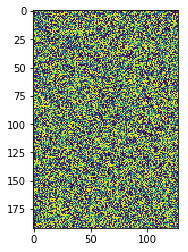

In [ ]:
plt.imshow(predicted[40])

In [ ]:
history = np.load("F:\Jyoti Shukla -MS\codes\conv2d\conv2D_model_2_history.npy",allow_pickle='True').item()
history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error', 'lr'])

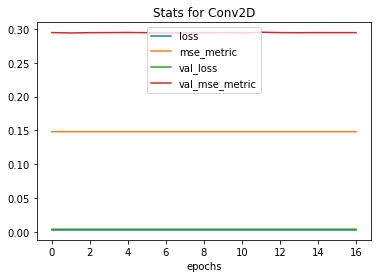

In [ ]:
plt.plot(history['loss'])
plt.plot(history['mean_squared_error'])
plt.plot(history['val_loss'])
plt.plot(history['val_mean_squared_error'])

plt.title('Stats for Conv2D')
plt.xlabel('epochs')
plt.legend(['loss','mse_metric','val_loss','val_mse_metric'])
plt.show()

# ML Models

## LR

In [ ]:
train_image_flattened = train_dataset.reshape(1999,49152)
train_label_flattened = train_labels.reshape(1999,49152)
train_image_flattened.shape

(1999, 49152)

In [ ]:
from sklearn.multioutput import RegressorChain
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(train_image_flattened,train_label_flattened)

LinearRegression()

0.9645251761440656


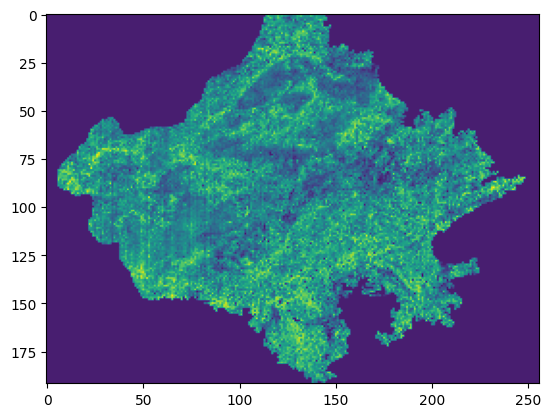

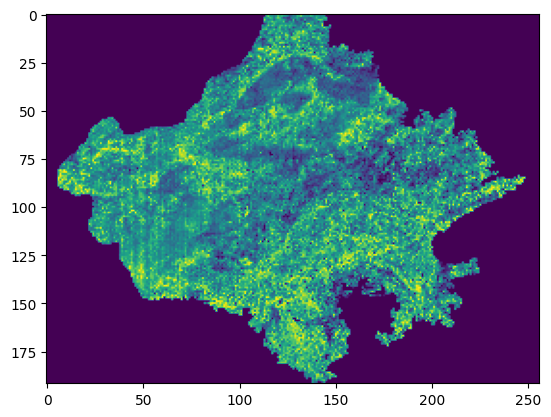

In [ ]:
pred = model.predict(test_dataset[0].reshape(1,49152))
from sklearn.metrics import r2_score
pred = pred.reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
print(r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
predicted = model.predict(test_dataset.reshape(65,49152))
predicted = predicted.reshape(65,192,256)
print(predicted.shape)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_LR_rajasthan.npy", predicted)

(65, 192, 256)


<bound method _EagerTensorBase.numpy of <tf.Tensor: shape=(), dtype=float32, numpy=0.00023690543>>
0.0023801334 0.9645251764944957


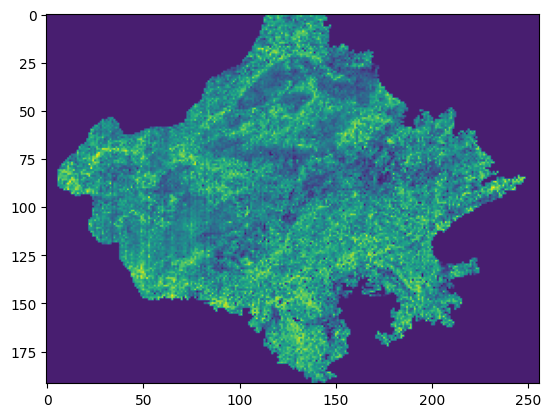

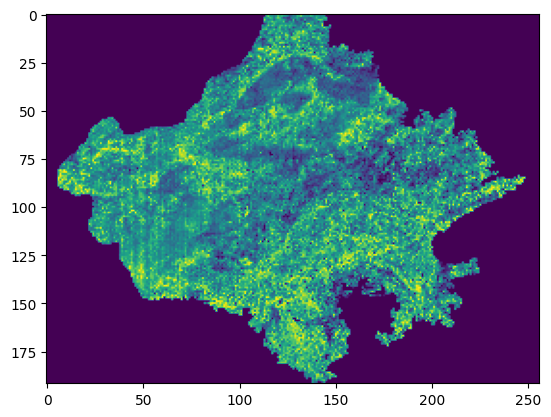

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
import tensorflow as tf
predicted = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_LR_rajasthan.npy")
pred = predicted[0].reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
huber = tf.keras.losses.Huber(delta=0.01)
print(huber(yreal,pred).numpy)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
R2 =[]
error =[]
yhat =[]
for i in range(len(test_dataset)):
    pred = predicted[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    yhat.append(pred)
    R2.append(r2)
    error.append(err)
print(R2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_LR_rajasthan.npy", R2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_LR_rajasthan.npy", error)

[0.9645251764944957, 0.9610240572316531, 0.9497068912710311, 0.9413292252225093, 0.9326792735001144, 0.924408330992664, 0.9115266178059717, 0.9217118711664533, 0.9267784108757359, 0.9384579872219032, 0.945357120899521, 0.941192458993979, 0.9369544415926705, 0.9343611356462476, 0.9293304305043502, 0.9216119068057897, 0.914164263657882, 0.9124312186790302, 0.9161561633903177, 0.9183779594736425, 0.9178668491314531, 0.921735345124415, 0.9307605366102781, 0.927290187918198, 0.8975119921780279, 0.8886713755441475, 0.897027429750837, 0.9158628607872111, 0.9243437104206296, 0.936954468877381, 0.9344270130649686, 0.9297577618208536, 0.9285038304316273, 0.928244397265434, 0.9267349116483325, 0.9278064113410232, 0.9280243339109946, 0.9208744158486482, 0.9152554579710096, 0.91161339154271, 0.9219197453838489, 0.934116488969959, 0.9312365319361631, 0.9369545064730815, 0.9346680075573935, 0.927562379304969, 0.919417195981926, 0.9036433239424357, 0.8765260945766424, 0.851452725132888, 0.844574888915

In [ ]:
MSE =[]
for i in range(len(test_dataset)):
    pred = predicted[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    #yhat.append(pred)
    #R2.append(r2)
    MSE.append(err)
print(MSE)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_LR_rajasthan.npy", MSE)
# np.save("MSE_for_LR.npy", MSE)

[0.0023801334, 0.002681556, 0.003459086, 0.0040570125, 0.0047200066, 0.005335304, 0.006624246, 0.0064240918, 0.006298542, 0.005370064, 0.004542385, 0.004638817, 0.0046174573, 0.0046931203, 0.0049480563, 0.0050698067, 0.005353123, 0.0055008, 0.0053802677, 0.005232444, 0.005230829, 0.0051112827, 0.004612604, 0.004721118, 0.0066647045, 0.0076506864, 0.006992937, 0.00597068, 0.005551983, 0.0049088434, 0.0051667187, 0.0056830514, 0.0060100732, 0.006119686, 0.0063611246, 0.006490447, 0.006853218, 0.007801439, 0.008911691, 0.00967201, 0.008369261, 0.0071548475, 0.0074980366, 0.0068273926, 0.0065791924, 0.007047277, 0.007519843, 0.008461896, 0.009770359, 0.010741852, 0.010751473, 0.010984448, 0.011549922, 0.010283489, 0.009101338, 0.008281084, 0.0075941095, 0.0071359696, 0.0065439544, 0.0059039043, 0.006199385, 0.0070903962, 0.007916411, 0.009156658, 0.009975845]


[0.02601836 0.02766052 0.03168067 0.03468375 0.03772215 0.04089543
 0.04603409 0.04473229 0.04403662 0.04035074 0.03698677 0.03751301
 0.03719877 0.03747508 0.03845545 0.03874172 0.03989116 0.04078768
 0.04040978 0.03997158 0.03987553 0.03953104 0.03741128 0.03807263
 0.04612581 0.0498605  0.04728274 0.04329035 0.04167035 0.03875406
 0.03962626 0.04137141 0.04220548 0.04233683 0.04314721 0.04377776
 0.04528971 0.04875202 0.05218041 0.05402407 0.05100561 0.04649821
 0.04757459 0.04450834 0.04308054 0.0444956  0.04621765 0.04956964
 0.05401365 0.05759362 0.05800901 0.05871414 0.06009896 0.05629392
 0.05293946 0.05016566 0.04798235 0.04699101 0.04510451 0.04222366
 0.04342392 0.04660162 0.04922765 0.0531163  0.05546403]


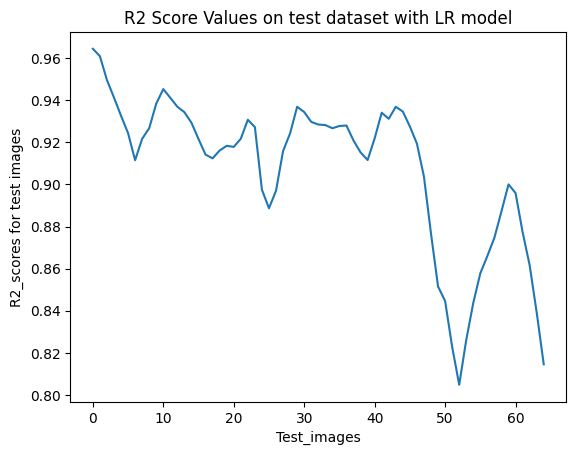

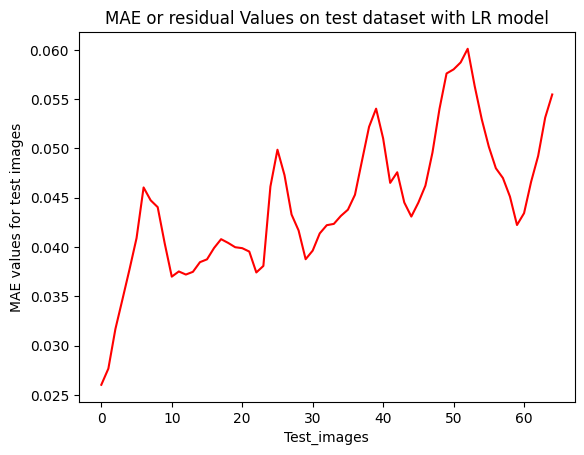

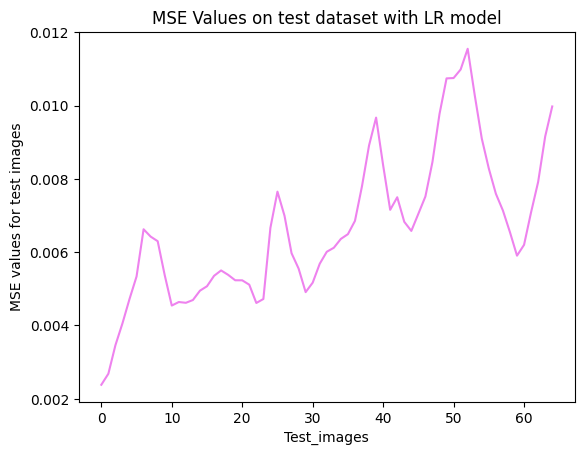

In [ ]:
R2 = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_LR_rajasthan.npy")
error = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_LR_rajasthan.npy")
MSE = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_LR_rajasthan.npy")
print(error)
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with LR model")
plt.show()
plt.plot(error,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with LR model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with LR model")
#plt.legend(["MAE","MSE"])
plt.show()

In [ ]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.9077659506883995, 0.9645251764944957, 0.0066499966, 0.10888865)

## KNN

In [ ]:
from sklearn.multioutput import RegressorChain
from sklearn.neighbors import KNeighborsRegressor
model_KNN = KNeighborsRegressor()
model_KNN.fit(train_image_flattened,train_label_flattened)

KNeighborsRegressor()

0.9414122794415388


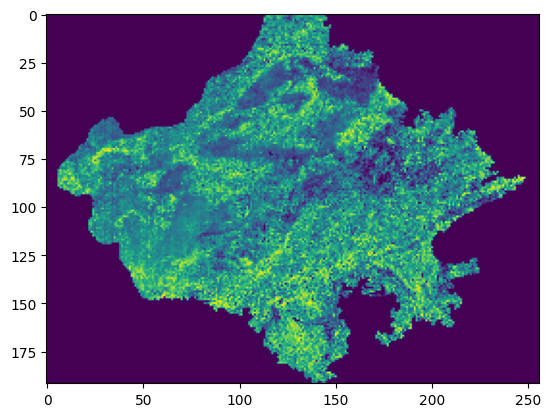

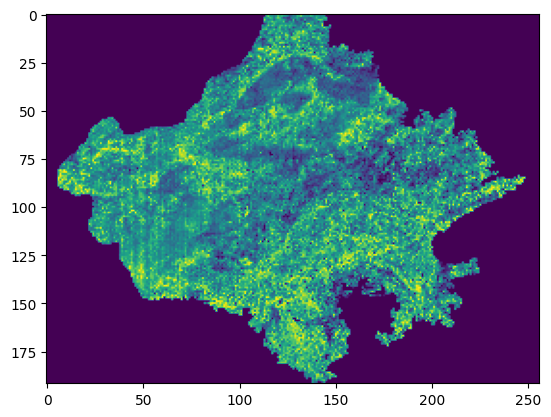

In [ ]:
pred = model_KNN.predict(test_dataset[0].reshape(1,49152))
from sklearn.metrics import r2_score
pred = pred.reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
print(r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
predicted_KNN = model_KNN.predict(test_dataset.reshape(65,49152))
predicted_KNN = predicted_KNN.reshape(65,192,256)
print(predicted_KNN.shape)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_KNN_rajasthan.npy", predicted_KNN)

(65, 192, 256)


0.003952632 0.9414122794415388


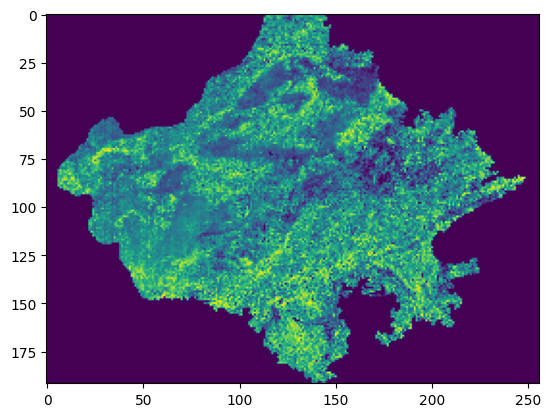

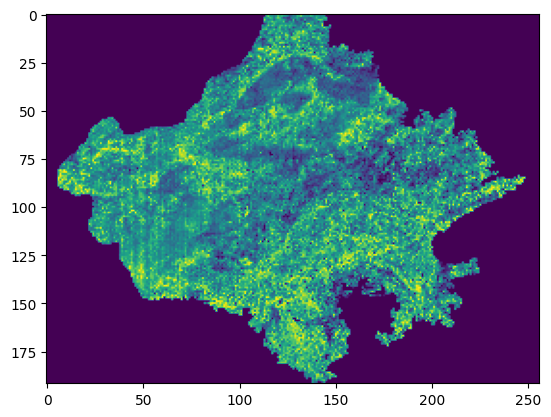

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_KNN_rajasthan.npy")
pred = predicted_KNN[0].reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
unscale_pred = unscale(pred,y_test[0])
unscale_real = unscale(yreal,y_test[0])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")

In [ ]:
R2_KNN =[]
error_KNN =[]
yhat_KNN =[]
for i in range(len(test_dataset)):
    pred = predicted_KNN[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    yhat_KNN.append(pred)
    R2_KNN.append(r2)
    error_KNN.append(err)
print(R2_KNN)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_KNN_rajasthan.npy",R2_KNN)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_KNN_rajasthan.npy",error_KNN)

[0.9414122794415388, 0.9274332478287013, 0.9110494795322535, 0.9073178389979626, 0.9013108903520735, 0.9063517521579965, 0.9305921982432495, 0.9135434946296628, 0.9099415930404089, 0.9157002348191213, 0.9289299062276768, 0.9422603073887794, 0.9396677425994938, 0.9338962194047333, 0.9343641986663684, 0.9252210276119248, 0.9187762928554071, 0.9162337352060226, 0.9172451733466184, 0.918262707105886, 0.9219096281516219, 0.9294713912369268, 0.9415902814540847, 0.942938598022999, 0.9288197515960387, 0.9203446978118083, 0.9103455027225351, 0.9293247791480452, 0.9348025525827965, 0.9296840792727359, 0.9187953114802283, 0.9123761791328963, 0.905661334519541, 0.8982985587885384, 0.8932498255670829, 0.9175655706870764, 0.9222376819485156, 0.9103611773892204, 0.9160122202604679, 0.9151544579440248, 0.9293288710045107, 0.9182260941919406, 0.9224650854029146, 0.9230721738772959, 0.9040758512721669, 0.9024734129638846, 0.8803704827555257, 0.8388460672438667, 0.859501748629695, 0.8362041297441531, 0.8

In [ ]:
predicted_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_KNN_rajasthan.npy")
R2_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_KNN_rajasthan.npy")
error_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_KNN_rajasthan.npy")
MSE_KNN = []
for i in range(len(test_dataset)):
    pred = predicted_KNN[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    #yhat_KNN.append(pred)
    # R2_KNN.append(r2)
    MSE_KNN.append(err)
print(MSE_KNN)
#np.save("R2_score_KNN.npy",R2_KNN)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_KNN_rajasthan.npy",MSE_KNN)

[0.003952632, 0.0050119916, 0.0062151724, 0.0066240695, 0.0072256275, 0.007042866, 0.005279856, 0.006951431, 0.0074517983, 0.0071012652, 0.005754647, 0.0046158917, 0.004493585, 0.0047483994, 0.004657331, 0.0050290534, 0.005175843, 0.0052995863, 0.00524724, 0.005267987, 0.0052825697, 0.004920515, 0.0042768633, 0.004462538, 0.0052193375, 0.006150912, 0.006788138, 0.005655034, 0.0055190567, 0.006006186, 0.0067835324, 0.007347674, 0.008123297, 0.008709586, 0.009169303, 0.007477291, 0.0072840946, 0.008535438, 0.008380286, 0.008526409, 0.007357861, 0.008505324, 0.008172737, 0.008419226, 0.01001278, 0.009717567, 0.011574854, 0.014106577, 0.011785597, 0.012992667, 0.012557562, 0.012038407, 0.011767542, 0.012129269, 0.012467858, 0.011334996, 0.010277217, 0.009329619, 0.0078235455, 0.00733732, 0.0073020686, 0.0074050557, 0.007195131, 0.0087670535, 0.011640467]


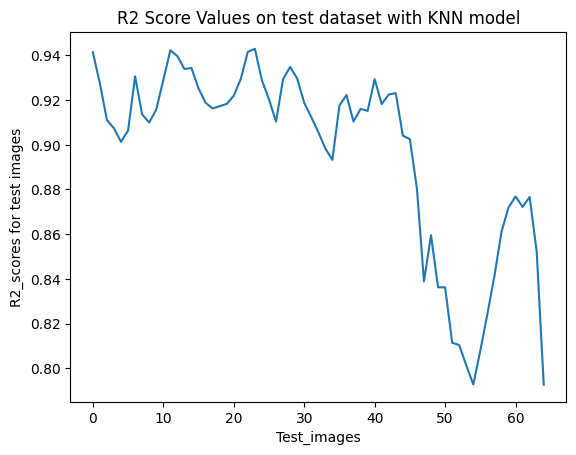

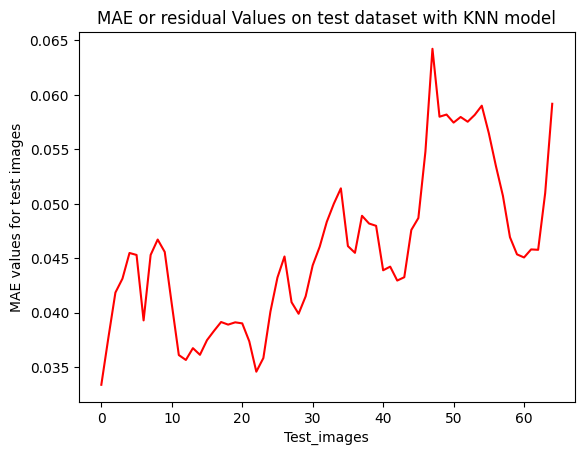

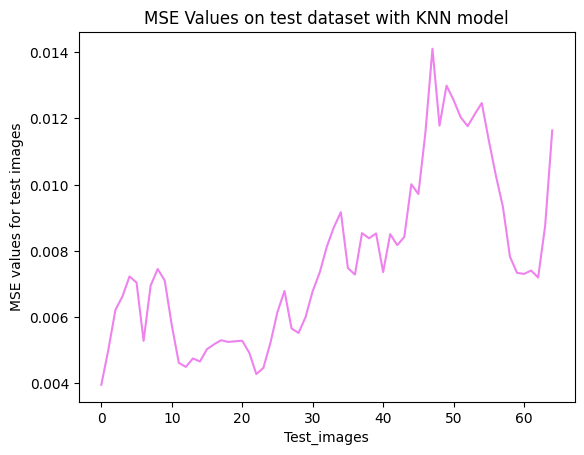

In [ ]:
R2_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_KNN_rajasthan.npy")
error_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_KNN_rajasthan.npy")
MSE_KNN = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_KNN_rajasthan.npy")
plt.plot(R2_KNN)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with KNN model")
plt.show()
plt.plot(error_KNN,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with KNN model")
plt.show()
plt.plot(MSE_KNN, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with KNN model")
plt.show()

In [ ]:
np.mean(R2_KNN), np.max(R2_KNN), np.mean(MSE_KNN), np.mean(error_KNN)

(0.8966409642052563, 0.942938598022999, 0.007688964, 0.045720737)

## DT

In [ ]:
from sklearn.tree import DecisionTreeRegressor
model_DT = DecisionTreeRegressor(max_depth=2, random_state=42)
model_DT.fit(train_image_flattened,train_label_flattened)

DecisionTreeRegressor(max_depth=2, random_state=42)

0.719650444968867


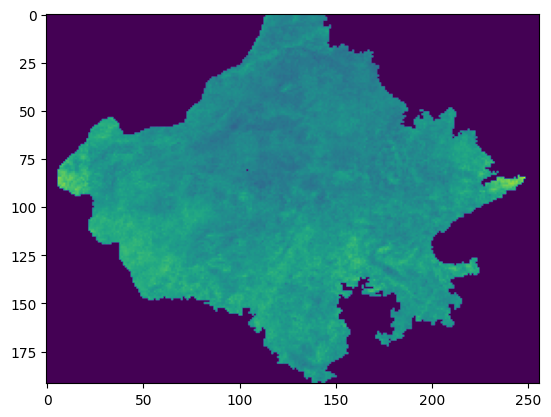

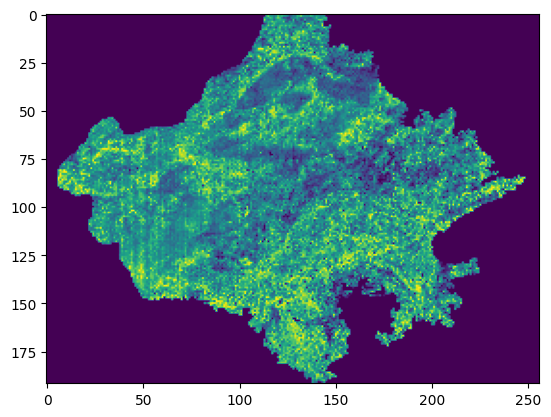

In [ ]:
pred = model_DT.predict(test_dataset[0].reshape(1,49152))
from sklearn.metrics import r2_score
pred = pred.reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
print(r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
predicted_DT = model_DT.predict(test_dataset.reshape(65,49152))
predicted_DT = predicted_DT.reshape(65,192,256)
print(predicted_DT.shape)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_DT_rajasthan.npy", predicted_DT)

(65, 192, 256)


0.018360840113715516 0.719650444968867


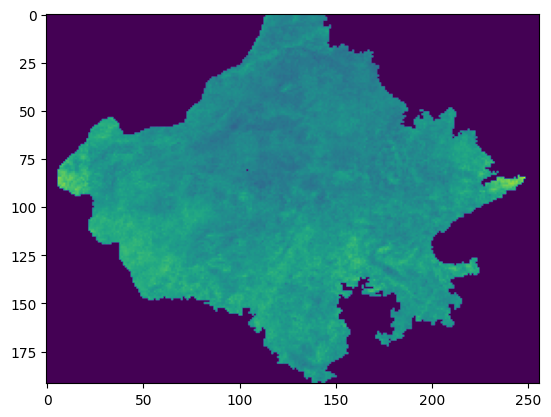

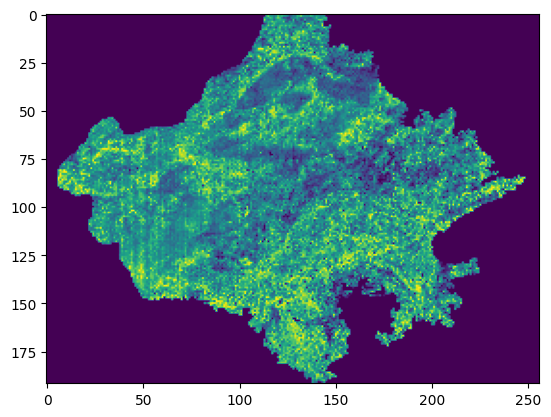

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
predicted_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_DT_rajasthan.npy")
pred = predicted_DT[0].reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
unscale_pred = unscale(pred,y_test[0])
unscale_real = unscale(yreal,y_test[0])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")

In [ ]:
R2_DT =[]
error_DT =[]
yhat_DT =[]
for i in range(len(test_dataset)):
    pred = predicted_DT[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    yhat_DT.append(pred)
    R2_DT.append(r2)
    error_DT.append(err)
print(R2_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_DT_rajasthan.npy",R2_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_DT_rajasthan.npy",error_DT)

[0.719650444968867, 0.7383158135882548, 0.7464432371490082, 0.752916305732046, 0.8255811727785536, 0.85654788407249, 0.8581805639797411, 0.8454072336073734, 0.8373648819176597, 0.8348761145532655, 0.8313830371525563, 0.8233939815492691, 0.8038977309156701, 0.7800285207316242, 0.7689717232449413, 0.7518652810945431, 0.7542747057597761, 0.7757731955810783, 0.7966643698718695, 0.8126656616035108, 0.8231439536530601, 0.8342678044909921, 0.8384653385384264, 0.8239165828330149, 0.7590071287115304, 0.7043618532033464, 0.7037584655326873, 0.7333026072013998, 0.7796951851736043, 0.8248191383708078, 0.8424668889547988, 0.8453001823312738, 0.8462906866147824, 0.8443324103780088, 0.8400525383405395, 0.8359199527973167, 0.8283885381588446, 0.8052467443998943, 0.7858680619829568, 0.7746375944244437, 0.7240006668601763, 0.7151424916248645, 0.7100815334171694, 0.7159738563223956, 0.7036766861634145, 0.6964625072100987, 0.6918893736431659, 0.6664874552866643, 0.6168899965349017, 0.6461549002865405, 0.6

In [ ]:
predicted_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_DT_rajasthan.npy")
R2_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_DT_rajasthan.npy")
error_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_DT_rajasthan.npy")
MSE_DT = []
for i in range(len(test_dataset)):
    pred = predicted_DT[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    #yhat_DT.append(pred)
    # R2_DT.append(r2)
    MSE_DT.append(err)
print(MSE_DT)
#np.save("R2_score_DT.npy",R2_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_DT_rajasthan.npy",MSE_DT)

[0.018360840113715516, 0.017195350112169654, 0.016960099972382067, 0.016709979562664887, 0.011834886183760046, 0.010084751637513404, 0.010808185065663996, 0.01301917082640263, 0.014303946140092635, 0.014420595695419623, 0.014011377378074268, 0.01377597013081246, 0.014340063275885669, 0.015338174591709865, 0.015858403280787838, 0.015961039695698086, 0.015486169379379728, 0.014056560616176548, 0.013244908471370501, 0.012247251943531198, 0.011488707132735445, 0.01070217391354655, 0.010238705195360544, 0.011312766581645338, 0.01575461391754325, 0.019516745339451698, 0.019558269005002307, 0.018195519237204562, 0.01567426135499146, 0.012821133268174306, 0.011649574243268117, 0.011636752348101832, 0.011862274813272811, 0.01222050633249766, 0.012694363317990513, 0.013467629413330452, 0.014922475133030015, 0.017484432736769372, 0.02041577713288164, 0.02195286135989492, 0.027858942255391365, 0.028935585999476796, 0.030060156423842545, 0.030437434690548097, 0.030879335962425893, 0.030693726352087

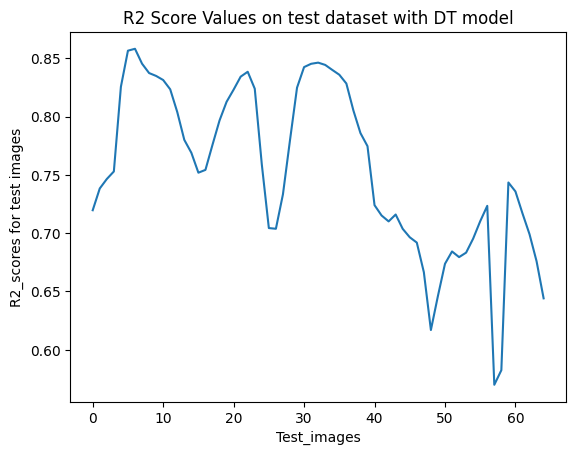

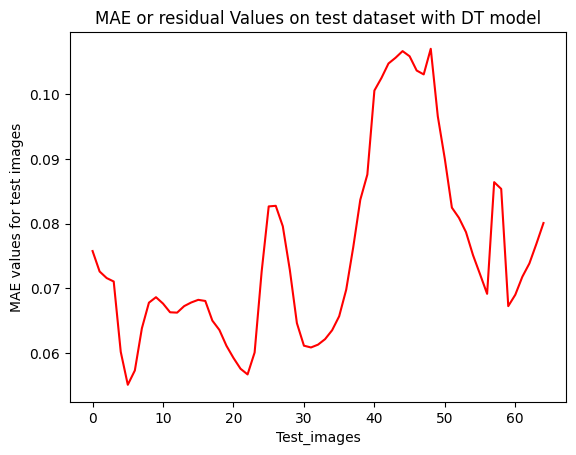

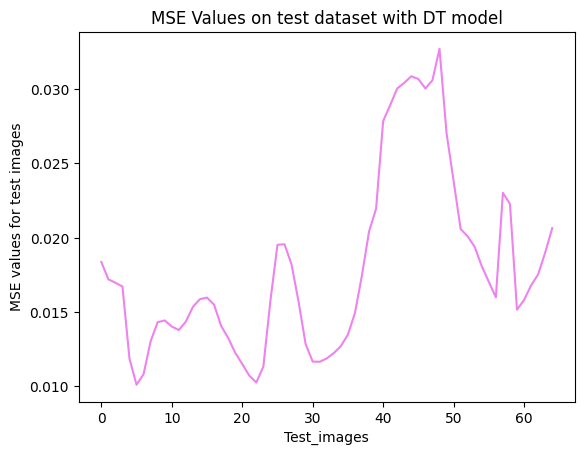

In [ ]:
R2_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_DT_rajasthan.npy")
error_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_DT_rajasthan.npy")
MSE_DT = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_DT_rajasthan.npy")
plt.plot(R2_DT)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with DT model")
plt.show()
plt.plot(error_DT,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with DT model")
plt.show()
plt.plot(MSE_DT, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with DT model")
plt.show()

In [ ]:
np.mean(R2_DT), np.max(R2_DT), np.mean(MSE_DT), np.mean(error_DT)

(0.755251186889277,
 0.8581805639797411,
 0.017939105607854333,
 0.07538868636323429)

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# define used regressor
forest=RandomForestRegressor(n_estimators=3,max_depth=2, verbose=2, n_jobs=-1)

# train model
forest.fit(train_image_flattened, train_label_flattened)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 64 concurrent workers.


building tree 1 of 3building tree 2 of 3
building tree 3 of 3



[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed: 149.3min finished


RandomForestRegressor(max_depth=2, n_estimators=3, n_jobs=-1, verbose=2)

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   3 out of   3 | elapsed:    0.0s finished


0.7205708819056722


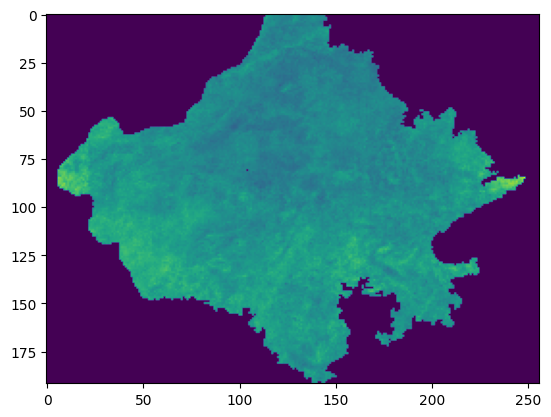

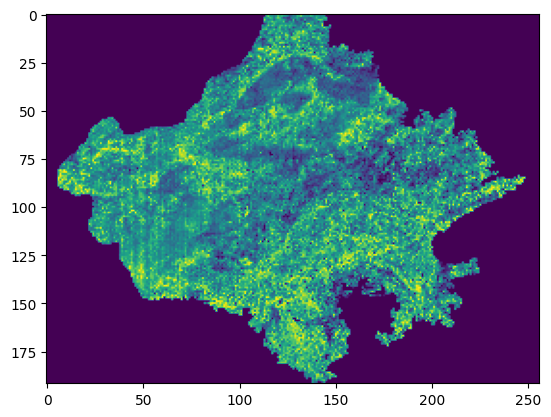

In [ ]:
pred = forest.predict(test_dataset[0].reshape(1,49152))
from sklearn.metrics import r2_score
pred = pred.reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
print(r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
predicted_RF = forest.predict(test_dataset.reshape(65,49152))
predicted_RF = predicted_RF.reshape(65,192,256)
print(predicted_RF.shape)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_RF_rajasthan.npy", predicted_RF)

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   3 out of   3 | elapsed:    0.0s finished


(65, 192, 256)


0.01827756555892117 0.7205708819056722


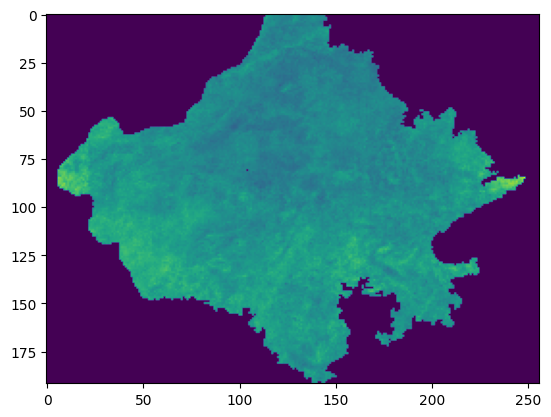

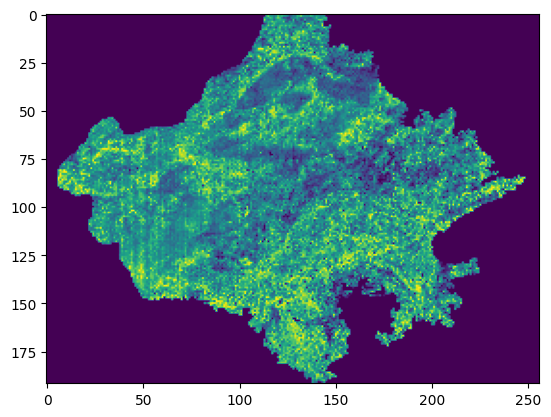

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
predicted_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_RF_rajasthan.npy")
pred = predicted_RF[0].reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
unscale_pred = unscale(pred,y_test[0])
unscale_real = unscale(yreal,y_test[0])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")

In [ ]:
R2_RF =[]
error_RF =[]
yhat_RF =[]
for i in range(len(test_dataset)):
    pred = predicted_RF[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    yhat_RF.append(pred)
    R2_RF.append(r2)
    error_RF.append(err)
print(R2_RF)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_RF_rajasthan.npy",R2_RF)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_RF_rajasthan.npy",error_RF)

[0.7205708819056722, 0.738418776552574, 0.7455666252504853, 0.8003303663902166, 0.8390474919280986, 0.8698998189145164, 0.8707977246230867, 0.8561740601495739, 0.847143019455737, 0.8439237831457579, 0.8403972670461569, 0.832351752369443, 0.8121497116725016, 0.7864693589266301, 0.7730704768371339, 0.75437168631711, 0.7559509489450296, 0.776976003539507, 0.7963376214404803, 0.8112968037133576, 0.8222058320668513, 0.8336652712356836, 0.83863209042423, 0.8255167749616192, 0.7637710855223437, 0.7113127574510205, 0.7116180771689228, 0.7415781492070203, 0.7882219320665951, 0.8325770962079105, 0.8495670076456362, 0.85280808565666, 0.8550818353594152, 0.8539818755625588, 0.8507170614788057, 0.8479854644575946, 0.8419001853127042, 0.8191984710283162, 0.8002742641682439, 0.7887808226527306, 0.7423102179104611, 0.733716723630121, 0.7286320840477085, 0.7349230313456485, 0.7225623609336754, 0.7152011750893277, 0.7102979746501051, 0.6840120317514107, 0.615455303170412, 0.6161660570716238, 0.639240810

In [ ]:
predicted_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_RF_rajasthan.npy")
R2_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_RF_rajasthan.npy")
error_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_RF_rajasthan.npy")
MSE_RF = []
for i in range(len(test_dataset)):
    pred = predicted_RF[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    #yhat_RF.append(pred)
    # R2_RF.append(r2)
    MSE_RF.append(err)
print(MSE_RF)
#np.save("R2_score_RF.npy",R2_RF)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_RF_rajasthan.npy",MSE_RF)

[0.01827756555892117, 0.0171563670768827, 0.016974687982579097, 0.013383689325325132, 0.011007226323215973, 0.009269516678617588, 0.009981180628386386, 0.012239846970643684, 0.013571479367593706, 0.013735014118909074, 0.01336659085249677, 0.013189358462760497, 0.013844539891176746, 0.014992740473886951, 0.01568015334641641, 0.015915317418921528, 0.01550651527212325, 0.014114698529747003, 0.013379077715371043, 0.012436992177224323, 0.01165403768903668, 0.010853635665860086, 0.010357185272464191, 0.011349821369359931, 0.015562142068101527, 0.01914668004788389, 0.019106915638900233, 0.017676273350103126, 0.015098585073778186, 0.012260218070676019, 0.011122319949073482, 0.01108410080256206, 0.01124846695066008, 0.011522081465966979, 0.011909121076378456, 0.012561989281532158, 0.013863586366084013, 0.016362823342173274, 0.01917674037906772, 0.02069072515135327, 0.026171186942225255, 0.027217448773718886, 0.028305585614054864, 0.028547702992170035, 0.028980479672159436, 0.028825367175522365,

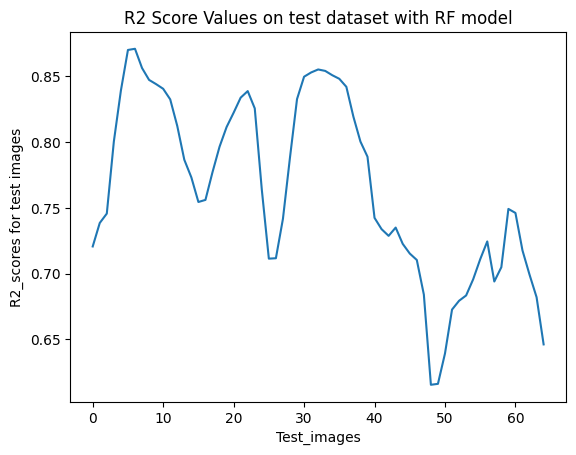

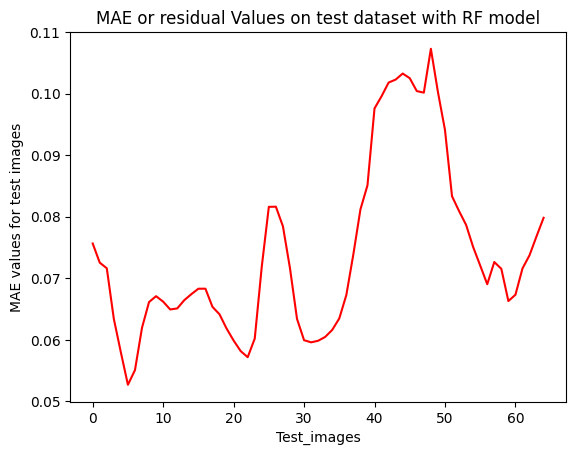

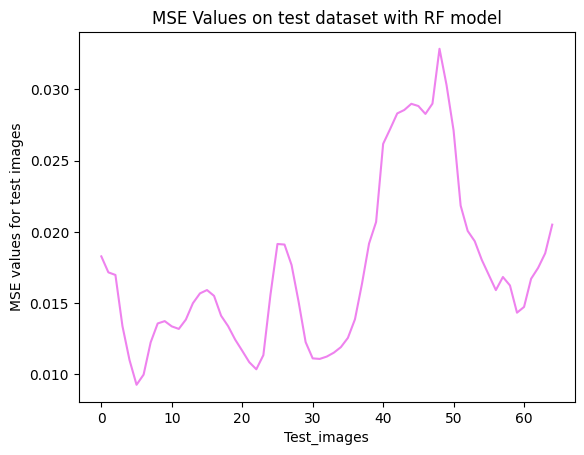

In [ ]:
R2_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_RF_rajasthan.npy")
error_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_RF_rajasthan.npy")
MSE_RF = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_RF_rajasthan.npy")
plt.plot(R2_RF)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with RF model")
plt.show()
plt.plot(error_RF,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with RF model")
plt.show()
plt.plot(MSE_RF, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with RF model")
plt.show()

In [ ]:
np.mean(R2_RF), np.max(R2_RF), np.mean(MSE_RF), np.mean(error_RF)

(0.7653539423999066,
 0.8707977246230867,
 0.017286865530207543,
 0.073935296723951)

## XGBoost

In [ ]:
import xgboost as xg
# Instantiation
xgbr = xg.XGBRegressor(max_depth = 2, booster ='gbtree',objective='reg:squarederror',
                  n_estimators = 2, n_jobs= -1, random_state = 0, verbosity =1)
xgbr.fit(train_image_flattened, train_label_flattened)

XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=2, n_jobs=-1, num_parallel_tree=None, predictor=None,
             random_state=0, ...)

In [ ]:
predicted_xgb = xgbr.predict(test_dataset.reshape(65,49152))
predicted_xgb = predicted_xgb.reshape(65,192,256)
print(predicted_xgb.shape)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_xgb_rajasthan.npy", predicted_xgb)

(65, 192, 256)


0.03711976 0.2083329661102083


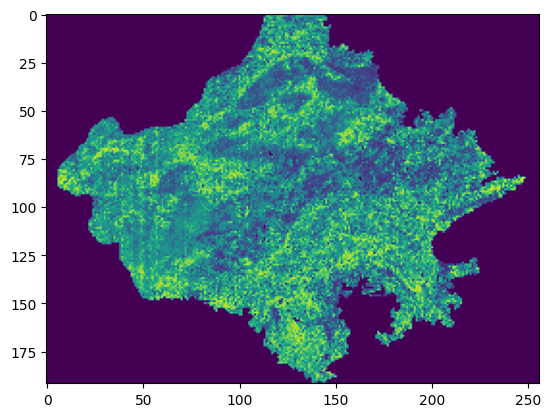

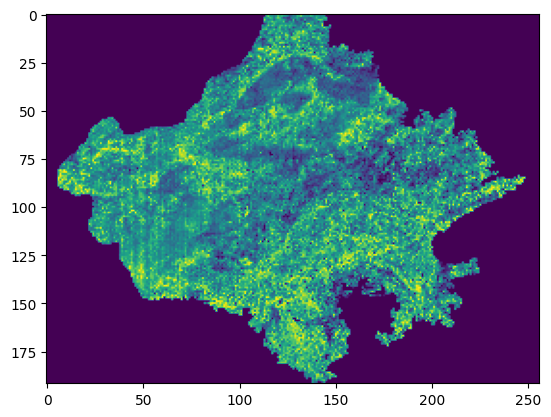

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
predicted_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_xgb_rajasthan.npy")
pred = predicted_xgb[0].reshape(192,256)
yreal = test_labels[0].reshape(192,256)
r2 = r2_score(yreal,pred)
error = mse(yreal,pred)
print(error,r2)
plt.imshow(pred)
plt.show()
plt.imshow(yreal)

In [ ]:
unscale_pred = unscale(pred,y_test[0])
unscale_real = unscale(yreal,y_test[0])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")

In [ ]:
R2_xgb =[]
error_xgb =[]
yhat_xgb =[]
for i in range(len(test_dataset)):
    pred = predicted_xgb[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    r2 = r2_score(yreal,pred)
    err = mae(yreal,pred)
    yhat_xgb.append(pred)
    R2_xgb.append(r2)
    error_xgb.append(err)
print(R2_xgb)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_xgb_rajasthan.npy",R2_xgb)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_xgb_rajasthan.npy",error_xgb)

[0.2083329661102083, 0.23570356078730098, 0.2544691327952593, 0.2782994299723566, 0.3058889139109946, 0.32996823309746126, 0.3442549451006855, 0.35200450284785545, 0.3575410660180047, 0.3533646671896211, 0.334206282472906, 0.30877290746692676, 0.2735895476643262, 0.24448684507182852, 0.24475150176961105, 0.2182803298851485, 0.2125670928181239, 0.21576560823348906, 0.22808480757665958, 0.236593432552065, 0.23571443891050253, 0.2430244226868321, 0.24946988981443285, 0.25106316026409564, 0.21556807555008217, 0.21649930253414212, 0.23499366510246725, 0.261951057467996, 0.28879090009285424, 0.315184156340658, 0.3211719527887932, 0.32029573933147976, 0.3123956345479862, 0.31128097870436405, 0.3100961076611153, 0.31352026733569016, 0.31661560881692097, 0.2898872071115623, 0.2977337913871435, 0.3065909060187541, 0.26815722828403266, 0.29781142975907293, 0.2948017767118244, 0.29550676050670543, 0.2751177709005919, 0.2700146527404934, 0.2713881947873821, 0.2584653741039591, 0.2077469231845243, 0

In [ ]:
predicted_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_xgb_rajasthan.npy")
R2_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_xgb_rajasthan.npy")
error_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_xgb_rajasthan.npy")
MSE_xgb = []
for i in range(len(test_dataset)):
    pred = predicted_xgb[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    #yhat_xgb.append(pred)
    # R2_xgb.append(r2)
    MSE_xgb.append(err)
print(MSE_xgb)
#np.save("R2_score_xgb.npy",R2_xgb)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_xgb_rajasthan.npy",MSE_xgb)

[0.03711976, 0.03661479, 0.036703758, 0.036733307, 0.037914425, 0.03957048, 0.041742757, 0.043645624, 0.04349985, 0.04205189, 0.040986076, 0.040198073, 0.039842032, 0.040148593, 0.039545786, 0.038723074, 0.038378175, 0.03814687, 0.037807614, 0.037770793, 0.038132574, 0.038668457, 0.03951907, 0.041634277, 0.04766255, 0.049624205, 0.04801663, 0.046562202, 0.04404091, 0.04085244, 0.039418668, 0.039511226, 0.040034384, 0.039569356, 0.039744474, 0.04070291, 0.042323835, 0.045498364, 0.047603972, 0.048323795, 0.055922054, 0.053388294, 0.053770788, 0.052269038, 0.049985293, 0.047891475, 0.045542944, 0.043312795, 0.041476443, 0.03967418, 0.038625117, 0.038956746, 0.03816372, 0.03763879, 0.037100483, 0.03684114, 0.036349244, 0.036052004, 0.036087826, 0.036506735, 0.036725078, 0.037516125, 0.037746895, 0.038311742, 0.039110295]


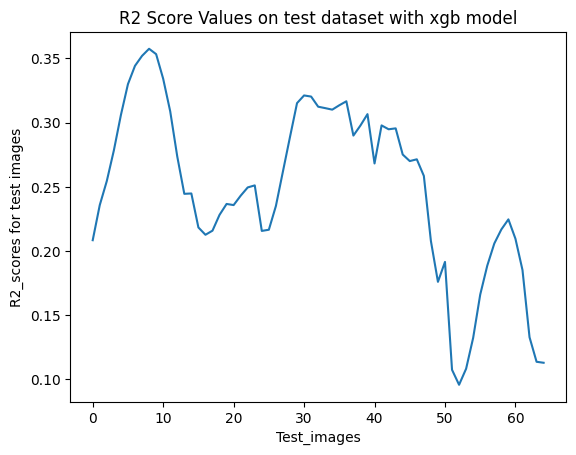

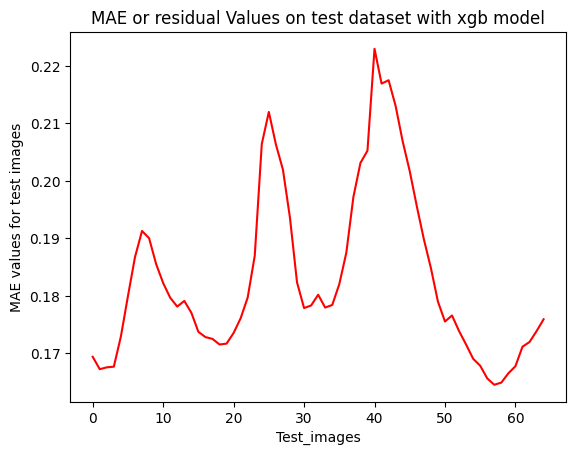

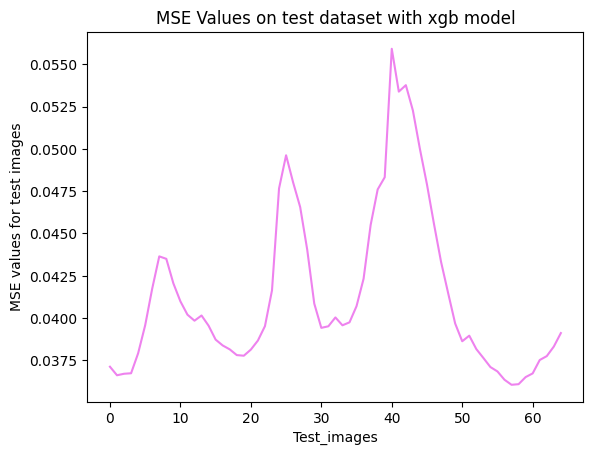

In [ ]:
R2_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/R2_score_xgb_rajasthan.npy")
error_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MAE_for_xgb_rajasthan.npy")
MSE_xgb = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/MSE_for_xgb_rajasthan.npy")
plt.plot(R2_xgb)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with xgb model")
plt.show()
plt.plot(error_xgb,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with xgb model")
plt.show()
plt.plot(MSE_xgb, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with xgb model")
plt.show()

In [ ]:
np.mean(R2_xgb), np.max(R2_xgb), np.mean(MSE_xgb), np.mean(error_xgb)

(0.24851670534064355, 0.3575410660180047, 0.04137774, 0.18321513)

# 1D-CNN


In [ ]:
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
#raw_seq = [10, 20, 30, 40, 50, 60, 70, 80, 90]
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
# choose a number of time steps
n_steps = 2
# split into samples
traindata = np.reshape(train_dataset, (1999,49152))
trainlabel =  np.reshape(train_labels,(1999,49152) )
X, y = split_sequence(traindata, n_steps)
X.shape, y.shape

((1997, 2, 49152), (1997, 49152))

In [ ]:
n_steps = 2
testdata = np.reshape(test_dataset, (65,49152))
testlabel =  np.reshape(test_labels,(65,49152) )
XTest, YTest = split_sequence(testdata, n_steps)
print(XTest.shape, YTest.shape)
n_features = XTest.shape[2]
XTest = XTest.reshape((XTest.shape[0], XTest.shape[1], n_features))

(63, 2, 49152) (63, 49152)


In [ ]:
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
# define model
n_features = X.shape[2]
X = X.reshape((X.shape[0], X.shape[1], n_features))
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
model.add(MaxPooling1D(pool_size=2, padding='same'))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(49152))
huber_loss = tf.keras.losses.Huber(delta=0.15)
model.compile(optimizer=keras.optimizers.SGD(learning_rate=0.25), loss=huber_loss, metrics=['mse'])
model.summary()
# fit model
history= model.fit(X, y, epochs=100, validation_data=(XTest, YTest), verbose=2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/1dcnn_AVHRR_model_rajasthan_history.npy", history.history)
model.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/1dcnn_AVHRR_model_rajasthan.h5")
# demonstrate prediction

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_9 (Conv1D)            (None, 1, 64)             6291520   
_________________________________________________________________
max_pooling1d_9 (MaxPooling1 (None, 1, 64)             0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 64)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 50)                3250      
_________________________________________________________________
dense_9 (Dense)              (None, 49152)             2506752   
Total params: 8,801,522
Trainable params: 8,801,522
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
63/63 - 2s - loss: 0.0372 - mse: 0.1883 - val_loss: 0.0413 - val_mse: 0.2211
Epoch 2/100
63/63 - 1

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model_1dcnn = load_model(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/1dcnn_AVHRR_model_rajasthan.h5")
history_1dcnn = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/1dcnn_AVHRR_model_rajasthan_history.npy",allow_pickle=True).item()
history_1dcnn.keys()

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])

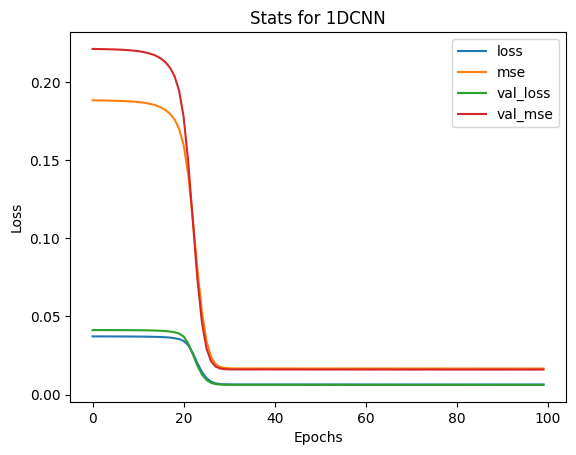

In [ ]:
# Results of updated model6

plt.plot(history_1dcnn['loss'])
plt.plot(history_1dcnn['mse'])
plt.plot(history_1dcnn['val_loss'])
plt.plot(history_1dcnn['val_mse'])

plt.title('Stats for 1DCNN')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','mse','val_loss','val_mse'])
plt.show()

In [ ]:
framed = XTest[4]
(np.expand_dims(framed, axis=0)).shape

(1, 2, 49152)

(1, 49152)
0.7930491260726493


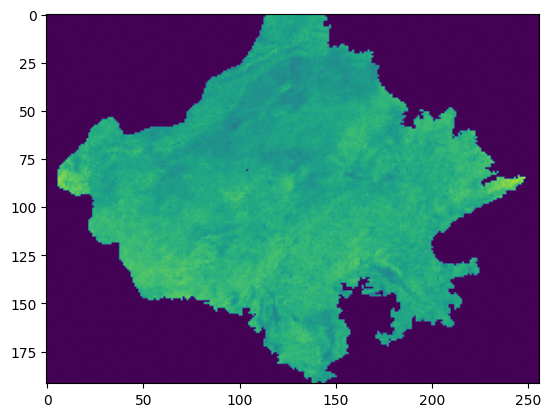

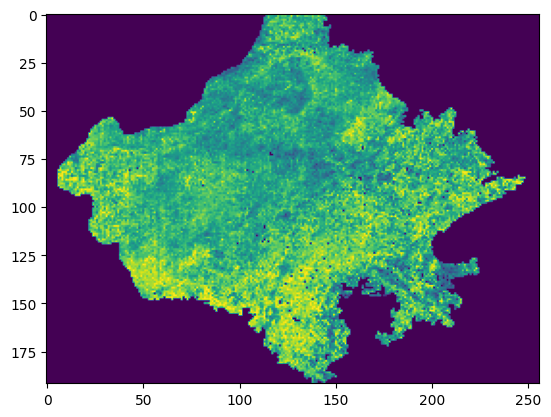

In [ ]:
model = model_1dcnn
from sklearn.metrics import r2_score
framed = XTest[4]
pred = model.predict(np.expand_dims(framed, axis=0))
print(pred.shape)
y_real = YTest[4].reshape(192,256)
pred = pred.reshape(192,256)
r2 = r2_score(y_real,pred)
print(r2)
plt.imshow(pred.reshape(192,256))
plt.figure()
plt.imshow(y_real.reshape(192,256))

In [ ]:
# data_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Padded_paired_unscaled_test_total_AVHRR_data_1981_2022.npz")
# test_data, test_label = data_test[0], data_test[1]
#print(test_data.shape, test_label.shape)
print(test_data_rfvhi.shape)
# vhi_train, vhi_train_label, n_steps = split_sequence(train_data, 4)
vhi_test, vhi_test_label, n_steps = split_sequence(rf_vhi_test, test_data_rfvhi, 2)
# print("Training Dataset Shapes: " + str(vhi_train.shape) + ", " + str(vhi_train_label.shape))
print("Validation Dataset Shapes: " + str(vhi_test.shape) + ", " + str(vhi_test_label.shape))

In [ ]:
pred = pred.reshape(192,128,1)
y_real = y_real.reshape(192,128,1)
unscale_pred = unscale(pred,vhi_test_label[4])
unscale_real = unscale(y_real,vhi_test_label[4])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("1D- CNN Outputs")

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = XTest
label = YTest
predicted_mod =[]
true = []
R2_mod =[]
res_mod = []
mse_mod =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i]
    y_real = label[i].reshape(192,256)
    # test = framed.reshape(1,1,192,256,1)
    pred = model.predict(np.expand_dims(framed, axis=0))
    pred = pred.reshape(192,256)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    res_mod.append(residual)
    err = mse(y_real,pred)
    mse_mod.append(err)
    predicted_mod.append(pred)
    true.append(y_real)
    R2_mod.append(r2)

np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_1DCNN_rajasthan.npy", R2_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_1DCNN_rajasthan.npy",res_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_1DCNN_rajasthan.npy",mse_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/Predicted_outputs_1DCNN_rajasthan.npy", predicted_mod)
# r2 = r2_score(y_real, pred)
print(len(R2_mod))
print('r2 score for test data on model is: \n', R2_mod)

63
r2 score for test data on model is: 
 [0.7139540571168497, 0.7363549844833922, 0.7576315097648567, 0.7766271634790995, 0.7930491260726493, 0.8092172791374941, 0.8139918149970933, 0.8092858019283706, 0.7925803397632573, 0.7792239571157553, 0.7655221632455544, 0.7402815496219812, 0.712667442213725, 0.7028124212969726, 0.6905642149350959, 0.69963555266447, 0.7170585278644447, 0.7361013259826621, 0.7468294611354716, 0.7516285767783686, 0.7586943532208175, 0.7635265157027824, 0.7612646074991962, 0.7392759110329032, 0.757722711163736, 0.7862721918926661, 0.7998207253465, 0.8048377383880335, 0.7934967517523192, 0.7899806675214829, 0.793890985781873, 0.7964330087822924, 0.7926313747271767, 0.7887698389468856, 0.78915239099341, 0.7881623203838396, 0.7772592837346128, 0.7770465050322497, 0.7793140011217958, 0.7755313042727232, 0.7753786152156904, 0.762628857685743, 0.7080244073729545, 0.6541122430987107, 0.6371995259219498, 0.6294264397106222, 0.6017433127563632, 0.5702261022498012, 0.5817706

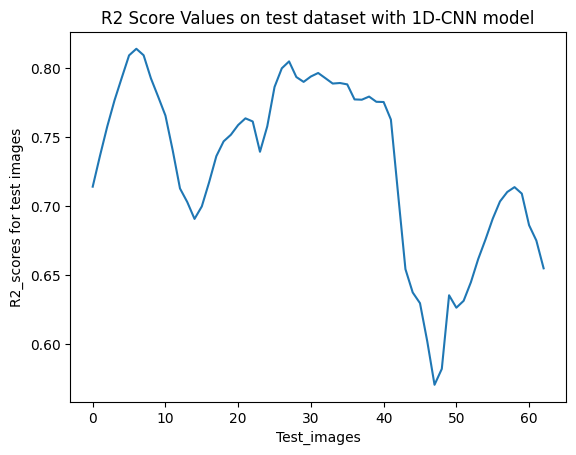

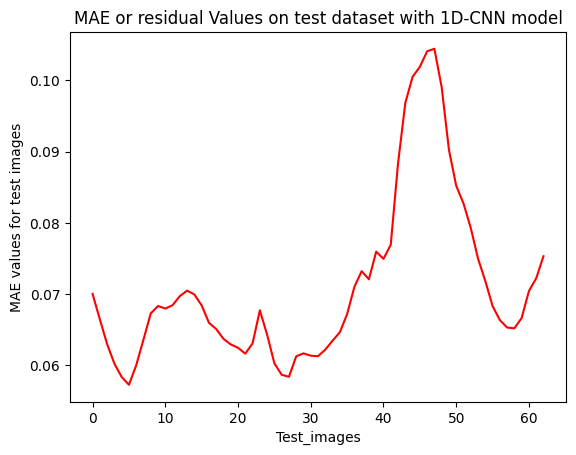

Text(0.5, 1.0, 'MSE Values on test dataset with 1D-CNN model')

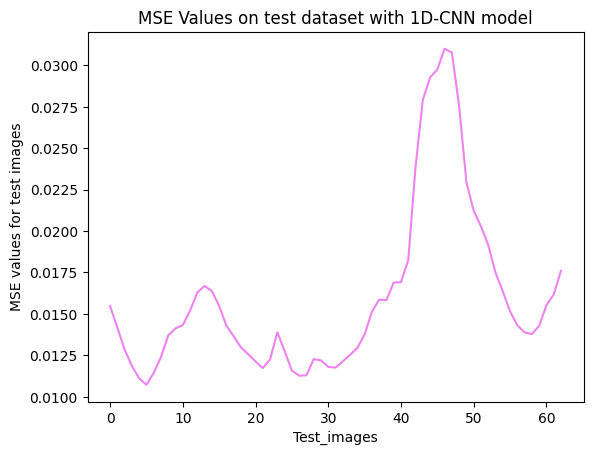

In [ ]:
R2 = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_1DCNN_rajasthan.npy")
res = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_1DCNN_rajasthan.npy")
MSE = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_1DCNN_rajasthan.npy")
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with 1D-CNN model")

In [ ]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.7300752479095627, 0.8139918149970933, 0.016014472, 0.07110638)

# Ensemble Method


In [ ]:
predicted_convlstm_3d = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models\predicted_convlstm_conv3d_AVHRR_rajasthan_model_6.1.npy")
predicted_convlstm_3d.shape


(63, 192, 256)

In [ ]:
predicted_LR = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_LR_rajasthan.npy")
print(predicted_LR.shape)
predicted_LR_sub = predicted_LR[:-2]
predicted_LR_sub.shape

(65, 192, 256)


(63, 192, 256)

In [ ]:
predicted_pix2pix_Rajasthan = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\P2P model outputs 30K\predicted_output_pix2pix_model_27000_rajasthan.npy")
predicted_pix2pix_sub = predicted_pix2pix_Rajasthan[:-2].reshape(63,192,256)
predicted_pix2pix_sub.shape

(63, 192, 256)

In [ ]:
predicted_DT_rajasthan = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ML Models/predicted_DT_rajasthan.npy")
predicted_DT_sub = predicted_DT_rajasthan[:-2].reshape(63,192,256)
predicted_DT_sub.shape

(63, 192, 256)

Convlstm3D+LR


In [ ]:
ensemble_LR_convlstm_rajasthan = (predicted_LR_sub + predicted_convlstm_3d)/2
ensemble_LR_convlstm_rajasthan.shape

(63, 192, 256)

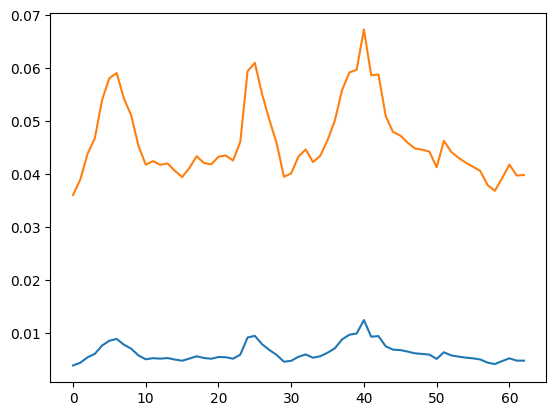

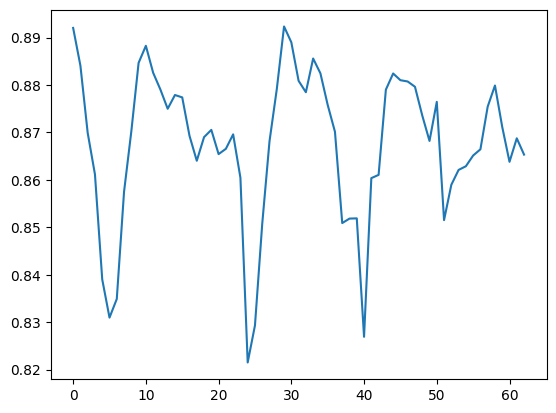

In [ ]:
MSE_ConvLSTM_LR =[]
R2_ConvLSTM_LR = []
MAE_ConvLSTM_LR =[]
preds = []
for i in range(len(test_dataset)-2):
    pred = ensemble_LR_convlstm_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_LR.append(err)
    R2_ConvLSTM_LR.append(r2)
    MAE_ConvLSTM_LR.append(abs_err)
# print(MSE_ConvLSTM_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_ConvLSTM_LR_rajasthan.npy", R2_ConvLSTM_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_ConvLSTM_LR_rajasthan.npy", MSE_ConvLSTM_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_ConvLSTM_LR_rajasthan.npy", MAE_ConvLSTM_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_ConvLSTM_LR_rajasthan.npy", preds)
#np.save("MSE_for_ConvLSTM_LR.npy", MSE_ConvLSTM_LR)
plt.plot(MSE_ConvLSTM_LR)
plt.plot(MAE_ConvLSTM_LR)
plt.show()
plt.plot(R2_ConvLSTM_LR)

In [ ]:
np.mean(R2_ConvLSTM_LR), np.max(R2_ConvLSTM_LR),np.mean(MSE_ConvLSTM_LR), np.mean(MAE_ConvLSTM_LR)

(0.8676048095871812, 0.8923483254128082, 0.0063633043, 0.046374533)

P2P+Convlstm3d

In [ ]:
ensemble_pix2pix_convlstm_rajasthan = (predicted_pix2pix_sub + predicted_convlstm_3d)/2
ensemble_pix2pix_convlstm_rajasthan.shape

(63, 192, 256)

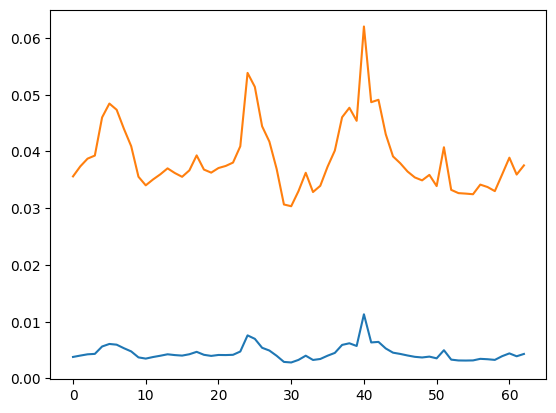

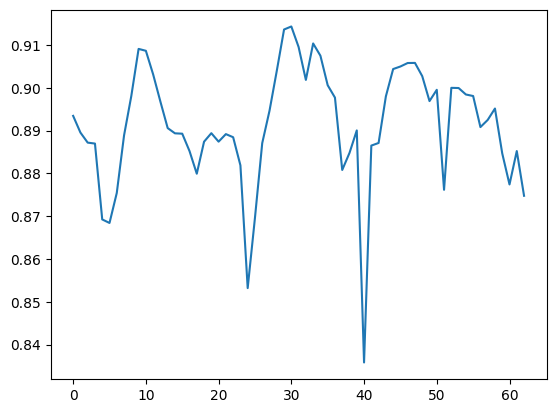

In [ ]:
MSE_ConvLSTM_pix2pix=[]
R2_ConvLSTM_pix2pix= []
MAE_ConvLSTM_pix2pix=[]
preds = []
for i in range(len(test_dataset)-2):
    pred = ensemble_pix2pix_convlstm_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_pix2pix.append(err)
    R2_ConvLSTM_pix2pix.append(r2)
    MAE_ConvLSTM_pix2pix.append(abs_err)
# print(MSE_ConvLSTM_pix2pix)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_ConvLSTM_pix2pix_rajasthan.npy", R2_ConvLSTM_pix2pix)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_ConvLSTM_pix2pix_rajasthan.npy", MSE_ConvLSTM_pix2pix)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_ConvLSTM_pix2pix_rajasthan.npy", MAE_ConvLSTM_pix2pix)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_ConvLSTM_pix2pix_rajasthan.npy", preds)
#np.save("MSE_for_ConvLSTM_pix2pix.npy", MSE_ConvLSTM_pix2pix)
plt.plot(MSE_ConvLSTM_pix2pix)
plt.plot(MAE_ConvLSTM_pix2pix)
plt.show()
plt.plot(R2_ConvLSTM_pix2pix)

In [ ]:
np.mean(R2_ConvLSTM_pix2pix), np.max(R2_ConvLSTM_pix2pix),np.mean(MSE_ConvLSTM_pix2pix), np.mean(MAE_ConvLSTM_pix2pix)

(0.8913253587186911, 0.9143331479164407, 0.0044842274, 0.038874544)

ConvLSTM+DT

In [ ]:
ensemble_DT_convlstm_rajasthan = (predicted_DT_sub + predicted_convlstm_3d)/2
ensemble_DT_convlstm_rajasthan.shape

(63, 192, 256)

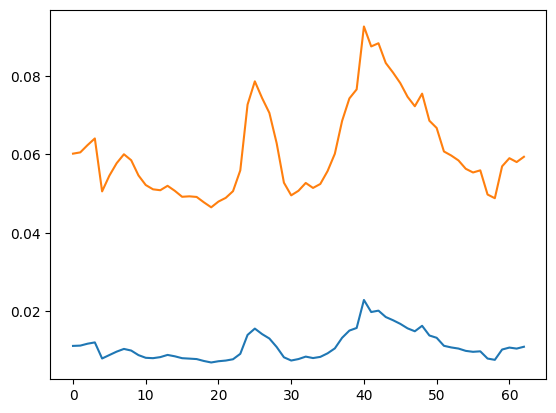

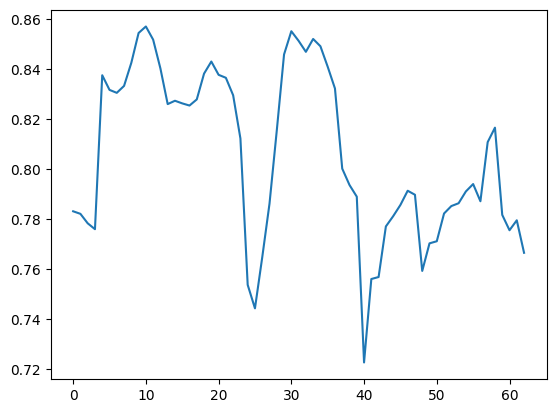

In [ ]:
MSE_ConvLSTM_DT=[]
R2_ConvLSTM_DT= []
MAE_ConvLSTM_DT=[]
preds = []
for i in range(len(test_dataset)-2):
    pred = ensemble_DT_convlstm_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_ConvLSTM_DT.append(err)
    R2_ConvLSTM_DT.append(r2)
    MAE_ConvLSTM_DT.append(abs_err)
# print(MSE_ConvLSTM_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_ConvLSTM_DT_rajasthan.npy", R2_ConvLSTM_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_ConvLSTM_DT_rajasthan.npy", MSE_ConvLSTM_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_ConvLSTM_DT_rajasthan.npy", MAE_ConvLSTM_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_ConvLSTM_DT_rajasthan.npy", preds)
#np.save("MSE_for_ConvLSTM_DT.npy", MSE_ConvLSTM_DT)
plt.plot(MSE_ConvLSTM_DT)
plt.plot(MAE_ConvLSTM_DT)
plt.show()
plt.plot(R2_ConvLSTM_DT)

In [ ]:
np.mean(R2_ConvLSTM_DT), np.max(R2_ConvLSTM_DT),np.mean(MSE_ConvLSTM_DT), np.mean(MAE_ConvLSTM_DT)

(0.8057990257593738,
 0.8569052459030649,
 0.011055059196383627,
 0.06090958030394465)

P2P+LR

In [ ]:
ensemble_P2P_LR_rajasthan = (predicted_LR.reshape(65,192,256) + predicted_pix2pix_Rajasthan.reshape(65,192,256))/2
ensemble_P2P_LR_rajasthan.shape

(65, 192, 256)

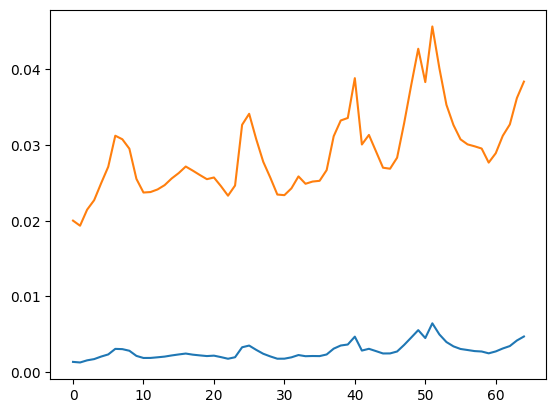

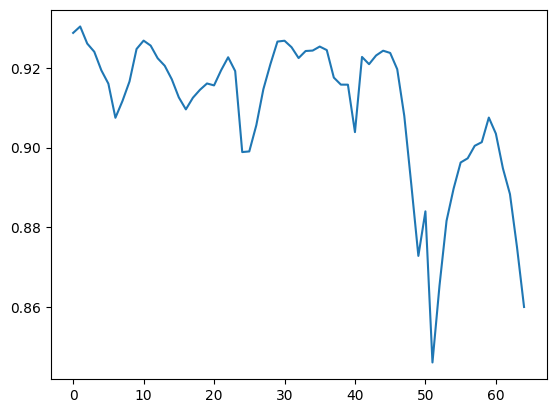

In [ ]:
MSE_P2P_LR=[]
R2_P2P_LR= []
MAE_P2P_LR=[]
preds = []
for i in range(len(test_dataset)):
    pred = ensemble_P2P_LR_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_P2P_LR.append(err)
    R2_P2P_LR.append(r2)
    MAE_P2P_LR.append(abs_err)
# print(MSE_P2P_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_P2P_LR_rajasthan.npy", R2_P2P_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_P2P_LR_rajasthan.npy", MSE_P2P_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_P2P_LR_rajasthan.npy", MAE_P2P_LR)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_P2P_LR_rajasthan.npy", preds)
#np.save("MSE_for_P2P_LR.npy", MSE_P2P_LR)
plt.plot(MSE_P2P_LR)
plt.plot(MAE_P2P_LR)
plt.show()
plt.plot(R2_P2P_LR)

In [ ]:
np.mean(R2_P2P_LR), np.max(R2_P2P_LR),np.mean(MSE_P2P_LR), np.mean(MAE_P2P_LR)

(0.9099675674485386, 0.9303723064558616, 0.0028086898, 0.02899559)

P2P+DT

In [ ]:
ensemble_DT_P2P_rajasthan = (predicted_DT_rajasthan.reshape(65,192,256) + predicted_pix2pix_Rajasthan.reshape(65,192,256))/2
ensemble_DT_P2P_rajasthan.shape

(65, 192, 256)

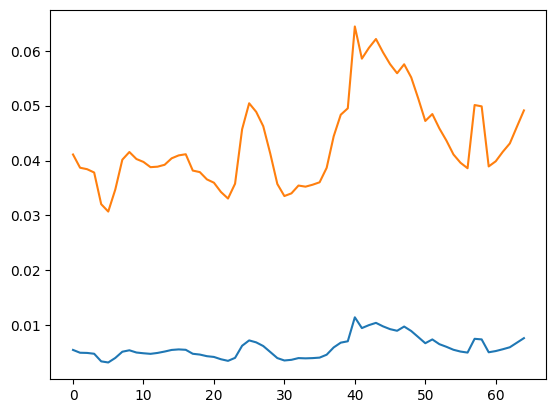

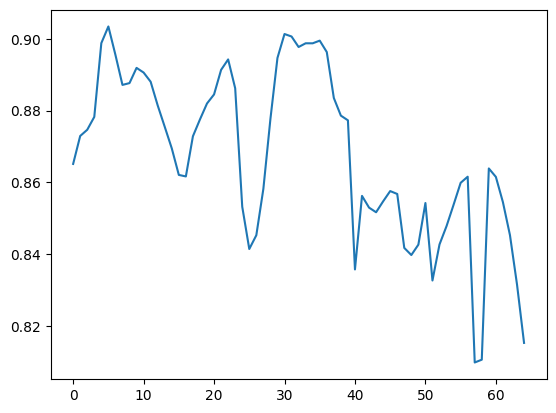

In [ ]:
MSE_P2P_DT=[]
R2_P2P_DT= []
MAE_P2P_DT=[]
preds = []
for i in range(len(test_dataset)):
    pred = ensemble_DT_P2P_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_P2P_DT.append(err)
    R2_P2P_DT.append(r2)
    MAE_P2P_DT.append(abs_err)
# print(MSE_P2P_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_P2P_DT_rajasthan.npy", R2_P2P_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_P2P_DT_rajasthan.npy", MSE_P2P_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_P2P_DT_rajasthan.npy", MAE_P2P_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_P2P_DT_rajasthan.npy", preds)
#np.save("MSE_for_P2P_DT.npy", MSE_P2P_DT)
plt.plot(MSE_P2P_DT)
plt.plot(MAE_P2P_DT)
plt.show()
plt.plot(R2_P2P_DT)

In [ ]:
np.mean(R2_P2P_DT), np.max(R2_P2P_DT),np.mean(MSE_P2P_DT), np.mean(MAE_P2P_DT)

(0.8678594264921516,
 0.9033962999378806,
 0.005943550273616826,
 0.04324761686806595)

DT+LR

In [ ]:
ensemble_DT_LR_rajasthan = (predicted_DT_rajasthan.reshape(65,192,256) + predicted_LR.reshape(65,192,256))/2
ensemble_DT_LR_rajasthan.shape

(65, 192, 256)

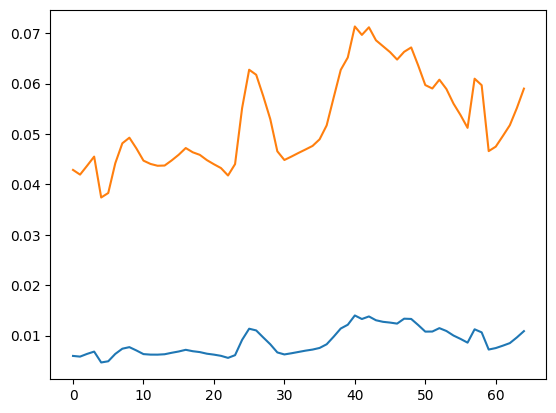

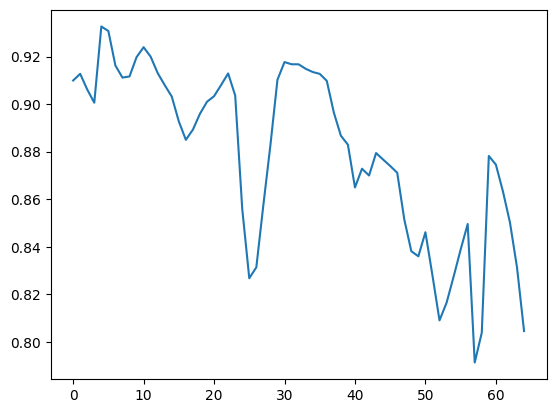

In [ ]:
MSE_LR_DT=[]
R2_LR_DT= []
MAE_LR_DT=[]
preds = []
for i in range(len(test_dataset)):
    pred = ensemble_DT_LR_rajasthan[i].reshape(192,256)
    yreal = test_labels[i].reshape(192,256)
    #r2 = r2_score(yreal,pred)
    err = mse(yreal,pred)
    r2 = r2_score(yreal,pred)
    abs_err = mae(yreal,pred)
    preds.append(pred)
    #R2.append(r2)
    MSE_LR_DT.append(err)
    R2_LR_DT.append(r2)
    MAE_LR_DT.append(abs_err)
# print(MSE_LR_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/R2_score_LR_DT_rajasthan.npy", R2_LR_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MSE_score_LR_DT_rajasthan.npy", MSE_LR_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/MAE_score_LR_DT_rajasthan.npy", MAE_LR_DT)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ensemble/predicted_LR_DT_rajasthan.npy", preds)
#np.save("MSE_for_LR_DT.npy", MSE_LR_DT)
plt.plot(MSE_LR_DT)
plt.plot(MAE_LR_DT)
plt.show()
plt.plot(R2_LR_DT)

In [ ]:
np.mean(R2_LR_DT), np.max(R2_LR_DT),np.mean(MSE_LR_DT), np.mean(MAE_LR_DT)

(0.8798625781913009,
 0.9326844737505744,
 0.008730586680628106,
 0.052633597455794184)

# LSTM models

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional

## BiLSTM

In [ ]:
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
# choose a number of time steps
n_steps = 2
# split into samples
traindata = np.reshape(train_dataset, (1999,49152))
trainlabel =  np.reshape(train_labels,(1999,49152) )
X, y = split_sequence(traindata, n_steps)
print(X.shape, y.shape)
n_steps = 2
testdata = np.reshape(test_dataset, (65,49152))
testlabel =  np.reshape(test_labels,(65,49152) )
XTest, YTest = split_sequence(testdata, n_steps)
print(XTest.shape, YTest.shape)
n_features = XTest.shape[2]
XTest = XTest.reshape((XTest.shape[0], XTest.shape[1], n_features))

(1997, 2, 49152) (1997, 49152)
(63, 2, 49152) (63, 49152)


In [ ]:
n_features = X.shape[2]
X = X.reshape((X.shape[0], X.shape[1], n_features))
model = Sequential()
    # Input layer
model.add(Bidirectional(LSTM(units = 50, return_sequences=True), input_shape=(n_steps, n_features)))
model.add(Bidirectional(LSTM(units = 1200, return_sequences=True), input_shape=(n_steps, n_features)))
model.add(Bidirectional(LSTM(units = 200)))
model.add(Dense(n_features))
#Compile model
model.compile(optimizer='adam',loss='mae',metrics=['mse'])
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_6 (Bidirection (None, 2, 100)            19681200  
_________________________________________________________________
bidirectional_7 (Bidirection (None, 2, 2400)           12489600  
_________________________________________________________________
bidirectional_8 (Bidirection (None, 400)               4161600   
_________________________________________________________________
dense_12 (Dense)             (None, 49152)             19709952  
Total params: 56,042,352
Trainable params: 56,042,352
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# early_stop = keras.callbacks.EarlyStopping(monitor = ‘val_loss’,
#                                                patience = 10)
history = model.fit(X, y, epochs=30, validation_data=(XTest, YTest), verbose=2)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/BiLSTM_AVHRR_model_rajasthan_history.npy", history.history)
model.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/BiLSTM_AVHRR_model_rajasthan.h5")

Epoch 1/30
63/63 - 12s - loss: 0.1844 - mse: 0.0987 - val_loss: 0.0890 - val_mse: 0.0220
Epoch 2/30
63/63 - 2s - loss: 0.0863 - mse: 0.0217 - val_loss: 0.0854 - val_mse: 0.0211
Epoch 3/30
63/63 - 2s - loss: 0.0890 - mse: 0.0239 - val_loss: 0.0833 - val_mse: 0.0207
Epoch 4/30
63/63 - 2s - loss: 0.0841 - mse: 0.0215 - val_loss: 0.0823 - val_mse: 0.0202
Epoch 5/30
63/63 - 2s - loss: 0.0839 - mse: 0.0215 - val_loss: 0.0832 - val_mse: 0.0208
Epoch 6/30
63/63 - 2s - loss: 0.0837 - mse: 0.0215 - val_loss: 0.0848 - val_mse: 0.0216
Epoch 7/30
63/63 - 2s - loss: 0.0835 - mse: 0.0215 - val_loss: 0.0827 - val_mse: 0.0206
Epoch 8/30
63/63 - 2s - loss: 0.0842 - mse: 0.0218 - val_loss: 0.0853 - val_mse: 0.0218
Epoch 9/30
63/63 - 2s - loss: 0.0836 - mse: 0.0216 - val_loss: 0.0831 - val_mse: 0.0209
Epoch 10/30
63/63 - 2s - loss: 0.0837 - mse: 0.0216 - val_loss: 0.0847 - val_mse: 0.0217
Epoch 11/30
63/63 - 2s - loss: 0.0835 - mse: 0.0216 - val_loss: 0.0824 - val_mse: 0.0205
Epoch 12/30
63/63 - 2s - loss

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import History
from tensorflow import keras
import tensorflow_addons as tfa
model_BiLSTM = load_model(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/BiLSTM_AVHRR_model_rajasthan.h5")
history_BiLSTM = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/BiLSTM_AVHRR_model_rajasthan_history.npy",allow_pickle=True).item()
history_BiLSTM.keys()

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])

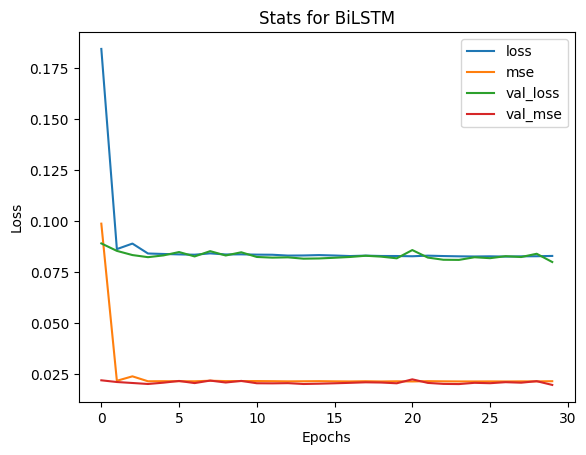

In [ ]:
# Results of updated model6

plt.plot(history_BiLSTM['loss'])
plt.plot(history_BiLSTM['mse'])
plt.plot(history_BiLSTM['val_loss'])
plt.plot(history_BiLSTM['val_mse'])

plt.title('Stats for BiLSTM')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','mse','val_loss','val_mse'])
plt.show()

In [ ]:
framed = XTest[4]
(np.expand_dims(framed, axis=0)).shape

(1, 2, 49152)

(1, 49152)
0.8114458557253544


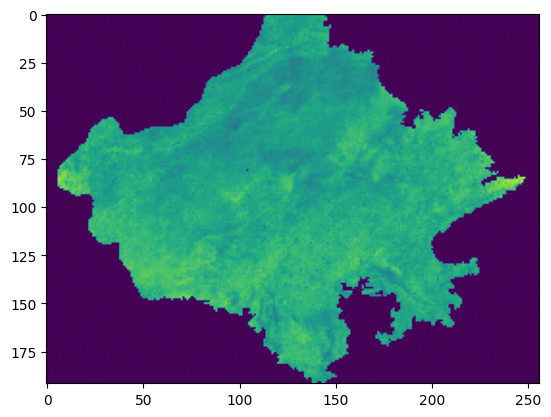

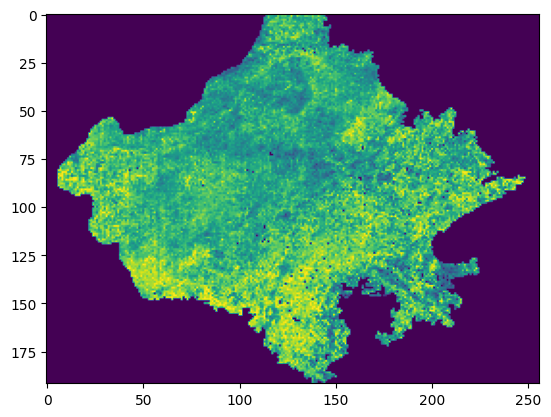

In [ ]:
model = model_BiLSTM
from sklearn.metrics import r2_score
framed = XTest[4]
pred = model.predict(np.expand_dims(framed, axis=0))
print(pred.shape)
y_real = YTest[4].reshape(192,256)
pred = pred.reshape(192,256)
r2 = r2_score(y_real,pred)
print(r2)
plt.imshow(pred.reshape(192,256))
plt.figure()
plt.imshow(y_real.reshape(192,256))

In [ ]:
# data_test = load_real_samples("F:\Jyoti Shukla -MS\karnataka dataset\Padded_paired_unscaled_test_total_AVHRR_data_1981_2022.npz")
# test_data, test_label = data_test[0], data_test[1]
#print(test_data.shape, test_label.shape)
print(test_data_rfvhi.shape)
# vhi_train, vhi_train_label, n_steps = split_sequence(train_data, 4)
vhi_test, vhi_test_label, n_steps = split_sequence(rf_vhi_test, test_data_rfvhi, 2)
# print("Training Dataset Shapes: " + str(vhi_train.shape) + ", " + str(vhi_train_label.shape))
print("Validation Dataset Shapes: " + str(vhi_test.shape) + ", " + str(vhi_test_label.shape))

In [ ]:
pred = pred.reshape(192,128,1)
y_real = y_real.reshape(192,128,1)
unscale_pred = unscale(pred,vhi_test_label[4])
unscale_real = unscale(y_real,vhi_test_label[4])
colorcoded_pred = colorcoding(unscale_pred)
colorcoded_real = colorcoding(unscale_real)
images = [colorcoded_real, colorcoded_pred]
titles =["Real","Predicted"]
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
for i in range(len(images)):
    pos = ax[i].imshow(images[i].reshape(192,128), cmap="rainbow")
    #ax.set_title(f"Original Frame {idx}")
    cax = fig.add_axes([ax[i].get_position().x1+0.01,ax[i].get_position().y0,0.02,ax[i].get_position().height])
    fig.colorbar(pos, ax = ax[i], cax =cax)
    ax[i].set_title(titles[i])
    #ax.axis("off")
fig.suptitle("1D- CNN Outputs")

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
data = XTest
label = YTest
predicted_mod =[]
true = []
R2_mod =[]
res_mod = []
mse_mod =[]
for i in range(len(data)):
    #for j in range(4):
    framed = data[i]
    y_real = label[i].reshape(192,256)
    # test = framed.reshape(1,1,192,256,1)
    pred = model.predict(np.expand_dims(framed, axis=0))
    pred = pred.reshape(192,256)
    r2 = r2_score(y_real,pred)
    residual = mae(y_real,pred)
    res_mod.append(residual)
    err = mse(y_real,pred)
    mse_mod.append(err)
    predicted_mod.append(pred)
    true.append(y_real)
    R2_mod.append(r2)

np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_bilstm_rajasthan.npy", R2_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_bilstm_rajasthan.npy",res_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_bilstm_rajasthan.npy",mse_mod)
np.save(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/Predicted_outputs_bilstm_rajasthan.npy", predicted_mod)
# r2 = r2_score(y_real, pred)
print(len(R2_mod))
print('r2 score for test data on model is: \n', R2_mod)

63
r2 score for test data on model is: 
 [0.6633719029025515, 0.7113130073490246, 0.7480884439969959, 0.7955762573372849, 0.8114458557253544, 0.8018455585624195, 0.7825114482656748, 0.7735668177360111, 0.7742440471608527, 0.7725156600663319, 0.7646230699438852, 0.7441288585648017, 0.7162638160987139, 0.7050726242244316, 0.6883836607771712, 0.6923345915038466, 0.7107592360290915, 0.730861517152284, 0.7424339935287467, 0.7479588831992477, 0.752669222397482, 0.7479356690734107, 0.7228703877355487, 0.6423849257616251, 0.5797561733847597, 0.5806903388177, 0.6182628556088515, 0.6768655793058582, 0.736857171686972, 0.7643446575143746, 0.7720468260109218, 0.7781318615481482, 0.7830340412841097, 0.7836242918465495, 0.7808518561777027, 0.772425030533652, 0.7392933267289157, 0.7158214224189706, 0.7016432418905723, 0.6473762244378927, 0.6379355108796814, 0.6342960469677124, 0.6517905374526213, 0.6450096103092813, 0.6427561222950038, 0.6438285128365494, 0.6274624682548262, 0.581678516833602, 0.5424

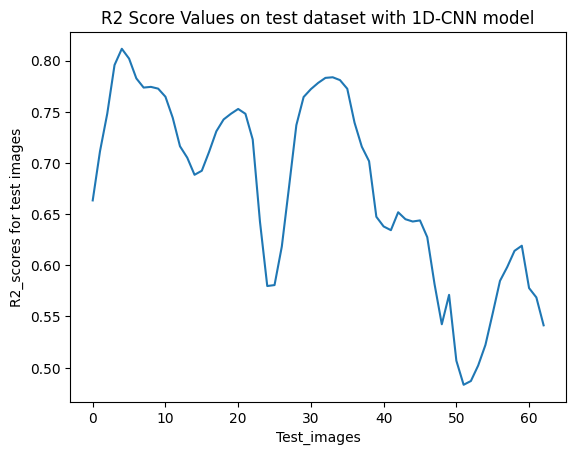

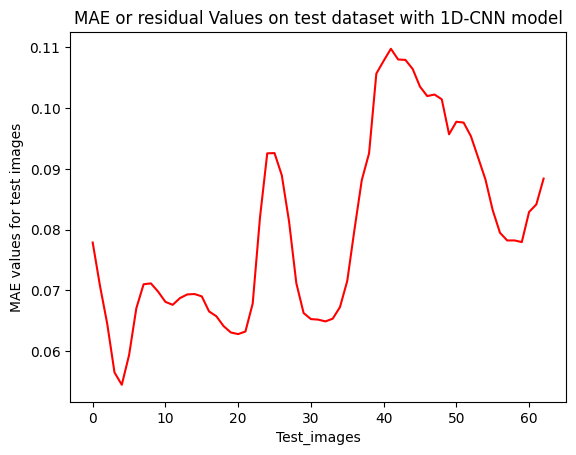

Text(0.5, 1.0, 'MSE Values on test dataset with 1D-CNN model')

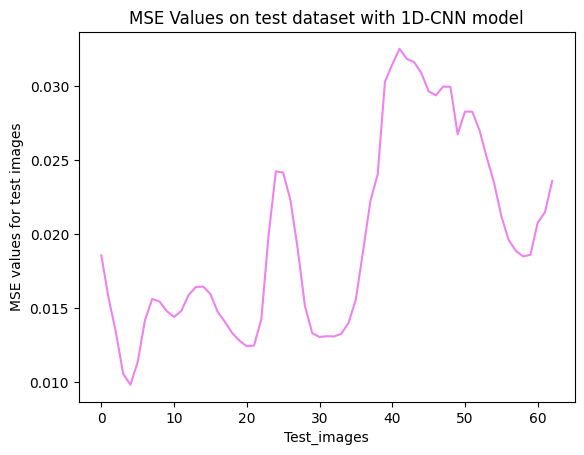

In [ ]:
R2 = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/R2_score_bilstm_rajasthan.npy")
res = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MAE_for_bilstm_rajasthan.npy")
MSE = np.load(r"E:\Jyoti Shukla - MS\rajasthan outputs\ConvLSTM models/MSE_for_bilstm_rajasthan.npy")
plt.plot(R2)
plt.xlabel("Test_images")
plt.ylabel("R2_scores for test images")
plt.title("R2 Score Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(res,color='red')
plt.xlabel("Test_images")
plt.ylabel("MAE values for test images")
plt.title("MAE or residual Values on test dataset with 1D-CNN model")
plt.show()
plt.plot(MSE, 'violet')
plt.xlabel("Test_images")
plt.ylabel("MSE values for test images")
plt.title("MSE Values on test dataset with 1D-CNN model")

In [ ]:
np.mean(R2), np.max(R2), np.mean(MSE), np.mean(res)

(0.67478247703476, 0.8114458557253544, 0.019703947, 0.07993548)